In [1]:
#읽으실 때 유의할 점: 헬스장 전처리와, 영화관 전처리, 서울 문화여가시설 정보지도검색(함수)을 주석처리해야 Run All가능, 그냥 실행 시 오류발생
#Run All 돌린 후 주석해제

# 서울시 내 자치구별 문화여가시설 분포 정보 분석 및 시각화

## 1. 목표

**목표**: 서울의 문화여가시설 분포에 대한 인사이트를 도출하고 시각화

## 2. 선정이유

**주제 선정 이유**:
- 처음 시작은 1인가구(여성,남성,노인), 신혼부부 등으로 다양한 가구유형에 따라 거주지를 탐색하는 데에 있어 문화여가생활이 쾌적한 지역이 어디인가를 찾도록 돕는 것에 초점을 맞춤
- 이후 현실적으로 수집가능한 데이터를 탐색해보며 서울에서 문화시설을 이용하려는 모든 시민에게 시각화 자료를 제공해 접근성을 높이고 개인선호에 따른 지역분석이 가능하도록 도울 수 있는 검색엔진을 구현해보는 것으로 아이디어 발전
- 더나아가 시설 분포에 대한 인사이트를 통해 문제점 및 개선점을 고민해보거나 추후 다른 아이디어와 연계해 발전시킬 가능성이 큰 주제라고 생각해 해당 주제를 선정

## 3. 데이터 수집 결과

**수집 문화여가시설 범위** :
도서관,
뮤지엄,
공연장,
공공문화시설,
체육관,
영화관,
서점,
전통시장,
공원,
홀로 사용하기 용이한 문화시설,
노인문화시설,
장애인문화시설

#### 라이브러리 임포트

In [5]:
# !pip install folium
import folium
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import requests
import json

pd.options.display.max_columns = 200
pd.options.display.max_info_columns =200

**데이터출처**

In [3]:
#df = pd.read_excel('./data/데이터 출처.xlsx')
#df 

,분석 시설 종류,출처,링크
0,"도서관, 뮤지엄, 공공문화시설",한국문화정보원,https://www.culture.go.kr/bigdata/user/data_ma...
1,공연장,한국문화정보원,https://www.bigdata-culture.kr/bigdata/user/da...
2,체육관,행정안전부,https://www.localdata.go.kr/devcenter/dataDown...
3,영화관,영화진흥위원회,https://www.kofic.or.kr/kofic/business/board/s...
4,서점,서울열린데이터광장,http://data.seoul.go.kr/dataList/OA-21062/S/1/...
5,전통시장,공공데이터포털\n한국문화정보원,https://www.data.go.kr/data/15052837/fileData....
6,공원,한국문화정보원,https://www.bigdata-culture.kr/bigdata/user/da...
7,나혼자 문화시설,한국문화정보원,https://www.bigdata-culture.kr/bigdata/user/da...
8,노인 문화시설,한국문화정보원,https://www.bigdata-culture.kr/bigdata/user/da...
9,장애인 문화시설,한국문화정보원,https://www.bigdata-culture.kr/bigdata/user/da...


## 4. 데이터 컬럼 및 변수 소개

In [4]:
df = pd.read_excel('./data/도서관, 뮤지엄, 공공문화시설.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])

df = pd.read_excel('./variable/도서관 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

           컬럼영문명        컬럼한글명    데이터타입
순서                                    
1             id         고유ID  VARCHAR
2          lclas       L1 대분류  VARCHAR
3          mlsfc       L2 중분류  VARCHAR
4      fclt_name          시설명  VARCHAR
5      ctprvn_nm           시도  VARCHAR
6        sgnr_nm          시군구  VARCHAR
7   legaldong_cd        법정동코드  VARCHAR
8    legalemd_nm       법정읍면동명  VARCHAR
9      adstrd_cd        행정동코드  VARCHAR
10     adstrd_nm         행정동명  VARCHAR
11   rdnmaddr_cd      도로명주소코드  VARCHAR
12     rdnm_addr        도로명주소  VARCHAR
13        zip_cd        신우편번호  VARCHAR
14       grid_cd         격자코드  VARCHAR
15          x_cd       X좌표 위도  VARCHAR
16          y_cd       Y좌표 경도  VARCHAR
17    buld_totar  시설현황 건물 연면적  VARCHAR
18     usemem_nm       연간이용자수  VARCHAR
19   infl_factor        영향도지수  VARCHAR
20     file_name          파일명  VARCHAR
21      base_ymd          기준일  VARCHAR


,변수명,변수의미
1,library_df,도서관 데이터 프레임
2,filtered_library_df,정제된 도서관 데이터 프레임
3,library_count_rank_sorted,도서관 그룹화된 구별 시설 개수 내림차순
4,library_count_rank,도서관 그룹화된 구별 시설 개수
5,library_scale_top5,시설규모 컬럼 내림차순
6,library_scale_rank,시설규모 상위 5개 시설
7,library_user_top5,이용자수 컬럼 내림차순
8,library_user_rank,이용자수 상위 5개 시설
9,library_infl_top5,영향력지수 컬럼 내림차순
10,library_infl_rank,영향력지수 상위 5개 시설


In [5]:
df = pd.read_excel('./variable/뮤지엄 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

,변수명,변수의미
1,museum_df,뮤지엄 데이터 프레임
2,filtered_museum_df,정제된 뮤지엄 데이터 프레임
3,museum_count_rank_sorted,뮤지엄 그룹화된 구별 시설 개수 내림차순
4,museum_count_rank,뮤지엄 그룹화된 구별 시설 개수
5,museum_scale_top5,시설규모 컬럼 내림차순
6,museum_scale_rank,시설규모 상위 5개 시설
7,museum_freq_top5,이용자수 컬럼 내림차순
8,museum_freq_rank,이용자수 상위 5개 시설
9,museum_user_top5,영향력지수 컬럼 내림차순
10,museum_user_rank,영향력지수 상위 5개 시설


In [6]:
df = pd.read_excel('./variable/공공문화시설 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

,변수명,변수의미
1,public_df,공공문화시설 데이터 프레임
2,filtered_public_df,정제된 공공문화시설 데이터 프레임
3,public_count_rank_sorted,공공문화시설 그룹화된 구별 시설 개수 내림차순
4,public_count_rank,공공문화시설 그룹화된 구별 시설 개수
5,public_scale_top5,시설규모 컬럼 내림차순
6,public_scale_rank,시설규모 상위 5개 시설
7,public_user_top5,이용자수 컬럼 내림차순
8,public_user_rank,이용자수 상위 5개 시설
9,public_infl_top5,영향력지수 컬럼 내림차순
10,public_infl_rank,영향력지수 상위 5개 시설


**공연장**

In [7]:
df = pd.read_excel('./data/공연장.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])
df = pd.read_excel('./variable/공연장 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

            컬럼영문명       컬럼한글명    데이터타입
순서                                    
1              id        고유ID  VARCHAR
2           lclas      L1 대분류  VARCHAR
3           mlsfc      L2 중분류  VARCHAR
4       fclt_name       시설명    VARCHAR
5       ctprvn_nm        시도    VARCHAR
6         sgnr_nm       시군구    VARCHAR
7    legaldong_cd     법정동코드    VARCHAR
8     legalemd_nm    법정읍면동명    VARCHAR
9       adstrd_cd     행정동코드    VARCHAR
10      adstrd_nm      행정동명    VARCHAR
11    rdnmaddr_cd   도로명주소코드    VARCHAR
12      rdnm_addr     도로명주소    VARCHAR
13         zip_cd       신우편번호  VARCHAR
14        grid_cd      격자코드    VARCHAR
15           x_cd  X(WGS84)    VARCHAR
16           y_cd  Y(WGS84)    VARCHAR
17      x_utmk_cd   X(UTMK)    VARCHAR
18      y_utmk_cd   Y(UTMK)    VARCHAR
19      prfplc_id    공연시설ID    VARCHAR
20       opn_year      개관년도    VARCHAR
21         chartr        특성    VARCHAR
22          seats       객석수    VARCHAR
23     prfplc_cnt      공연장수    VARCHAR
24          telno      전화

,변수명,변수의미
1,hall_df,공연장 데이터 프레임
2,filtered_hall_df,정제된 공연장 데이터 프레임
3,hall_count_rank_sorted,공연장 그룹화된 구별 시설 개수 내림차순
4,hall_count_rank,공연장 그룹화된 구별 시설 개수
5,hall_scale_top5,시설규모 컬럼 내림차순
6,hall_scale_rank,시설규모 상위 5개 시설
7,hall_freq_top5,이용자수 컬럼 내림차순
8,hall_freq_rank,이용자수 상위 5개 시설
9,hall_user_top5,영향력지수 컬럼 내림차순
10,hall_user_rank,영향력지수 상위 5개 시설


**체육관**

In [8]:
df = pd.read_csv('./data/체육관.csv', encoding="cp949")
df.index = np.arange(1, len(df)+1)
print(df)
df = pd.read_excel('./variable/체육관 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

       컬럼한글명    데이터타입
1         번호  int64  
2     개방서비스명  object 
3   개방서비스아이디  object 
4   개방자치단체코드  int64  
5       관리번호  object 
6      인허가일자  int64  
7    인허가취소일자  float64
8   영업상태구분코드  int64  
9      영업상태명  object 
10  상세영업상태코드  object 
11   상세영업상태명  object 
12      폐업일자  float64
13    휴업시작일자  float64
14    휴업종료일자  float64
15     재개업일자  float64
16     소재지전화  object 
17     소재지면적  float64
18   소재지우편번호  float64
19   소재지전체주소  object 
20   도로명전체주소  object 
21   도로명우편번호  float64
22      사업장명  object 
23    최종수정시점  float64
24   데이터갱신구분  object 
25   데이터갱신일자  object 
26     업태구분명  float64
27   좌표정보(x)  float64
28   좌표정보(y)  float64
29   문화체육업종명  object 
30    공사립구분명  object 
31  보험가입여부코드  object 
32      지도자수  float64
33     건축물동수  float64
34    건축물연면적  float64
35   회원모집총인원  float64
36     세부업종명  float64
37       법인명  float64


,변수명,변수의미
1,gym_df,체육관 데이터 프레임
2,filtered_public_df,정제된 체육관 데이터 프레임
3,gym_count_rank_sorted,체육관 그룹화된 구별 시설 개수 내림차순
4,gym_count_rank,체육관 그룹화된 구별 시설 개수


**영화관**

In [9]:
df = pd.read_excel('./data/영화관.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])
df = pd.read_excel('./variable/영화관 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

          컬럼영문명       컬럼한글명    데이터타입
순서                                  
1            id        고유ID  VARCHAR
2         lclas      L1 대분류  VARCHAR
3         mlsfc      L2 중분류  VARCHAR
4        id_poi  마스터 POI ID  VARCHAR
5        poi_nm       POI명   VARCHAR
6     branch_nm        지점명   VARCHAR
7        sub_nm        보조명   VARCHAR
8      mcate_cd       분류코드   VARCHAR
9      mcate_nm         분류명  VARCHAR
10          pnu     지번고유코드   VARCHAR
11      sido_nm       시도명칭   VARCHAR
12       sgg_nm      시군구명칭   VARCHAR
13      bemd_nm    법정읍면동명칭   VARCHAR
14        ri_nm        리명칭   VARCHAR
15       beonji         번지   VARCHAR
16      badm_cd      법정동코드   VARCHAR
17      hadm_cd      행정동코드   VARCHAR
18        rd_cd  새주소_도로명코드   VARCHAR
19        rd_nm    새주소_도로명   VARCHAR
20      bld_num   새주소_건물번호   VARCHAR
21            x      X좌표 경도  VARCHAR
22            y      Y좌표 위도  VARCHAR
23      grid_cd  GRID 격자 코드  VARCHAR
24  lst_updt_dt   최종업데이트 날짜  VARCHAR
25    data_orgn      데이터 출처  VARCHAR
2

,변수명,변수의미
1,movie_df,영화관 데이터 전처리 실시 전
2,name,영화관이름 전처리완료후 이름변수
3,movie_data,영화관 전처리 완료후
4,mcate,영화관 데이터 구별 count
5,movie_seat_top5_cinema,좌석수 top5 상영관
6,spe_df,특수상영관
7,special_top3_cinema,특수상영관 top3


**서점**

In [10]:
df = pd.read_csv('./data/서점.csv', encoding="cp949")
df.index = np.arange(1, len(df)+1)
print(df)
df = pd.read_excel('./variable/서점 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

       컬럼한글명    데이터타입
1         연번    int64
2      책방 이름   object
3       구 코드    int64
4       구 이름   object
5         주소   object
6       전화번호   object
7   홈페이지 url   object
8      책방 구분    int64
9     책방 구분명   object
10        위도  float64
11        경도  float64
12   SNS url   object


,변수명,변수의미
1,bookstore_df,서점 데이터 프레임
2,filtered_public_df,정제된 서점 데이터 프레임
3,bookstore_count_rank_sorted,서점 그룹화된 구별 시설 개수 내림차순
4,bookstore_count_rank,서점 그룹화된 구별 시설 개수


**전통시장**

In [11]:
df = pd.read_excel('./data/전통시장.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])
df = pd.read_excel('./variable/전통시장 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

              컬럼영문명       컬럼한글명    데이터타입
순서                                      
1                id      POI ID  VARCHAR
2         fclt_name         시장명  VARCHAR
3         ctprvn_nm          시도  VARCHAR
4           sgnr_nm         시군구  VARCHAR
5      legaldong_cd       법정동코드  VARCHAR
6       legalemd_nm        법정동명  VARCHAR
7         adstrd_cd       행정동코드  VARCHAR
8         adstrd_nm        행정동명  VARCHAR
9       rdnmaddr_cd       도로명코드  VARCHAR
10        rdnm_addr      도로명 주소  VARCHAR
11           zip_cd        우편번호  VARCHAR
12          grid_cd  GRID 격자 코드  VARCHAR
13             x_cd          경도  VARCHAR
14             y_cd          위도  VARCHAR
15          mrkt_ty       시장 유형  VARCHAR
16   mrkt_opn_cycle     시장 유지기간  VARCHAR
17         stor_cnt         상점수   DOUBLE
18          trt_itm      판매점 상세  VARCHAR
19    use_psbl_gcct   온누리상품권 사용  VARCHAR
20             hmpg        홈페이지  VARCHAR
21    pbctlt_pos_yn      화장실 여부  VARCHAR
22     prklt_pos_yn      주차장 여부  VARCHAR
23         opnng

,변수명,변수의미
1,market_df,전통시장 데이터 프레임
2,filtered_market_df,정제된 전통시장 데이터 프레임
3,market_count_rank_sorted,전통시장 그룹화된 구별 시설 개수 내림차순
4,market_count_rank,전통시장 그룹화된 구별 시설 개수
5,market_scale_top5,전통시장 규모 컬럼 내림차순
6,market_scale_rank,전통시장 규모 상위 5개 시설


**공원**

In [12]:
df = pd.read_excel('./data/공원.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])
df = pd.read_excel('./variable/공원 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

                 컬럼영문명    컬럼한글명    데이터타입
순서                                      
1             ESNTL_ID     고유ID  VARCHAR
2             LCLAS_NM     대분류명  VARCHAR
3             MLSFC_NM     중분류명  VARCHAR
4             FCLTY_NM      시설명  VARCHAR
5            CTPRVN_CD     시도코드  VARCHAR
6            CTPRVN_NM      시도명  VARCHAR
7            SIGNGU_CD    시군구코드  VARCHAR
8            SIGNGU_NM     시군구명  VARCHAR
9         LEGALDONG_CD    법정동코드  VARCHAR
10        LEGALDONG_NM     법정동명  VARCHAR
11          ROAD_NM_CD    도로명코드  VARCHAR
12  FCLTY_ROAD_NM_ADDR  시설도로명주소  VARCHAR
13            LNM_ADDR     지번주소  VARCHAR
14         ADDR_ENG_NM    주소영문명  VARCHAR
15           ADSTRD_CD    행정동코드  VARCHAR
16             BULD_NM      건물명  VARCHAR
17      BULD_MANAGE_CD   건물관리코드  VARCHAR
18              TEL_NO     전화번호  VARCHAR
19              ZIP_NO     우편번호  VARCHAR
20            HMPG_URL  홈페이지URL  VARCHAR
21            FCLTY_LA     시설위도  VARCHAR
22            FCLTY_LO     시설경도  VARCHAR
23           ORI

,변수명,변수의미
1,park_df,공원 데이터 프레임
2,filtered_park_df,정제된 공원 데이터 프레임
3,park_count_rank_sorted,공원 그룹화된 구별 시설 개수 내림차순
4,park_count_rank,공원 그룹화된 구별 시설 개수


**나혼자 문화시설**

In [13]:
df = pd.read_excel('./data/나혼자문화시설.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])
df = pd.read_excel('./variable/나혼자문화시설 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

                 컬럼영문명    컬럼한글명    데이터타입
순서                                      
1             ESNTL_ID     고유ID  VARCHAR
2             LCLAS_NM     대분류명  VARCHAR
3             MLSFC_NM     중분류명  VARCHAR
4             FCLTY_NM      시설명  VARCHAR
5            CTPRVN_CD     시도코드  VARCHAR
6            CTPRVN_NM      시도명  VARCHAR
7            SIGNGU_CD    시군구코드  VARCHAR
8            SIGNGU_NM     시군구명  VARCHAR
9         LEGALDONG_CD    법정동코드  VARCHAR
10        LEGALDONG_NM     법정동명  VARCHAR
11          ROAD_NM_CD    도로명코드  VARCHAR
12  FCLTY_ROAD_NM_ADDR  시설도로명주소  VARCHAR
13            LNM_ADDR     지번주소  VARCHAR
14         ADDR_ENG_NM    주소영문명  VARCHAR
15           ADSTRD_CD    행정동코드  VARCHAR
16             BULD_NM      건물명  VARCHAR
17      BULD_MANAGE_CD   건물관리코드  VARCHAR
18              TEL_NO     전화번호  VARCHAR
19              ZIP_NO     우편번호  VARCHAR
20            HMPG_URL  홈페이지URL  VARCHAR
21            FCLTY_LA     시설위도  VARCHAR
22            FCLTY_LO     시설경도  VARCHAR
23           ORI

,변수명,변수의미
1,alone_df,나혼자문화시설 데이터 프레임
2,filtered_alone_df,정제된 나혼자문화시설데이터 프레임
3,alone_count_rank_sorted,나혼자문화시설 그룹화된 구별 시설 개수 내림차순
4,alone_count_rank,나혼자문화시설 그룹화된 구별 시설 개수


**노인 문화시설**

In [14]:
df = pd.read_excel('./data/노인문화시설.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])
df = pd.read_excel('./variable/노인문화시설 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

           컬럼영문명        컬럼한글명    데이터타입
순서                                    
1             id         고유ID  VARCHAR
2          lclas       L1 대분류  VARCHAR
3          mlsfc       L2 중분류  VARCHAR
4      fclt_name          시설명  VARCHAR
5      ctprvn_nm           시도  VARCHAR
6        sgnr_nm          시군구  VARCHAR
7   legaldong_cd        법정동코드  VARCHAR
8    legalemd_nm       법정읍면동명  VARCHAR
9      adstrd_cd        행정동코드  VARCHAR
10     adstrd_nm         행정동명  VARCHAR
11   rdnmaddr_cd      도로명주소코드  VARCHAR
12     rdnm_addr        도로명주소  VARCHAR
13        zip_cd        신우편번호  VARCHAR
14       grid_cd         격자코드  VARCHAR
15          x_cd     X(WGS84)  VARCHAR
16          y_cd     Y(WGS84)  VARCHAR
17      oper_mby  운영주체(민간/공공)  VARCHAR
18         telno         전화번호  VARCHAR
19     x_utmk_cd      X(UTMK)  VARCHAR
20     y_utmk_cd      Y(UTMK)  VARCHAR
21   lst_updt_dt    최종업데이트 날짜  VARCHAR
22     data_orgn        데이터출처  VARCHAR
23     FILE_NAME          파일명  VARCHAR
24      base_ymd         

,변수명,변수의미
1,elderly_df,노인문화시설 데이터 프레임
2,filtered_elderly_df,정제된 노인문화시설데이터 프레임
3,elderly_count_rank_sorted,노인문화시설 그룹화된 구별 시설 개수 내림차순
4,elderly_count_rank,노인문화시설 그룹화된 구별 시설 개수


**장애인 문화시설**

In [15]:
df = pd.read_excel('./data/장애인문화시설.xls')
df.set_index("순서", inplace=True)
print(df.iloc[:,0:3])
df = pd.read_excel('./variable/장애인문화시설 변수.xlsx')
df.index = np.arange(1, len(df)+1)
df

                 컬럼영문명    컬럼한글명    데이터타입
순서                                      
1             ESNTL_ID     고유ID  VARCHAR
2             LCLAS_NM     대분류명  VARCHAR
3             MLSFC_NM     중분류명  VARCHAR
4             FCLTY_NM      시설명  VARCHAR
5            CTPRVN_CD     시도코드  VARCHAR
6            CTPRVN_NM      시도명  VARCHAR
7            SIGNGU_CD    시군구코드  VARCHAR
8            SIGNGU_NM     시군구명  VARCHAR
9         LEGALDONG_CD    법정동코드  VARCHAR
10        LEGALDONG_NM     법정동명  VARCHAR
11          ROAD_NM_CD    도로명코드  VARCHAR
12  FCLTY_ROAD_NM_ADDR  시설도로명주소  VARCHAR
13            LNM_ADDR     지번주소  VARCHAR
14         ADDR_ENG_NM    주소영문명  VARCHAR
15           ADSTRD_CD    행정동코드  VARCHAR
16             BULD_NM      건물명  VARCHAR
17      BULD_MANAGE_CD   건물관리코드  VARCHAR
18              TEL_NO     전화번호  VARCHAR
19              ZIP_NO     우편번호  VARCHAR
20            HMPG_URL  홈페이지URL  VARCHAR
21            FCLTY_LA     시설위도  VARCHAR
22            FCLTY_LO     시설경도  VARCHAR
23           ORI

,변수명,변수의미
1,phy_indoor_df,장애인문화시설 데이터 프레임
2,filtered_phy_indoor_df,정제된 장애인문화시설데이터 프레임
3,phy_indoor_count_rank_sorted,장애인문화시설 그룹화된 구별 시설 개수 내림차순
4,phy_indoor_count_rank,장애인문화시설 그룹화된 구별 시설 개수


In [130]:
pd.set_option('display.max_columns', None) ## 모든 열을 출력한다.
pd.set_option('display.max_rows', None) 

### 서울 문화여가시설 정보지도 검색

In [131]:
함수정의
def map_search():
    
    search = int(input())
    
    if search == 1:
        return m1
    elif search == 2:
        return m2
    elif search == 3:
        return m3
    elif search == 4:
        return m4
    elif search == 5:
        return m5
    elif search == 6:
        return m6
    elif search == 7:
        return m7
    elif search == 8:
        return m8
    elif search == 9:
        return m9
    elif search == 10:
        return m10
    elif search == 11:
        return m11
    elif search == 12:
        return m12
    elif search == 13:
        return m13
    elif search == 14:
        return m14
    elif search == 15:
        return m15
    elif search == 16:
        return m16
    elif search == 17:
        return m17
    elif search == 18:
        return m18
    elif search == 19:
        return m19
    elif search == 20:
        return m20
    elif search == 21:
        return m21
    elif search == 22:
        return m22
    elif search == 23:
        return m23
    elif search == 24:
        return m24
    elif search == 25:
        return m25
    elif search == 26:
        return m26
    elif search == 27:
        return m27
    elif search == 28:
        return m28
    elif search == 29:
        return m29
    elif search == 30:
        return m30
    elif search == 31:
        return m31
    elif search == 32:
        return m32
    elif search == 33:
        return m33
    elif search == 34:
        return m34
    elif search == 35:
        return m35
    elif search == 36:
        return m36
    elif search == 37:
        return m37
    elif search == 38:
        return m38
    elif search == 39:
        return m39
    elif search == 40:
        return m40
    elif search == 41:
        return m41
    elif search == 42:
        return m42
    elif search == 43:
        return m43
    elif search == 44:
        return m44
    elif search == 45:
        return m45
    elif search == 46:
        return m46
    elif search == 47:
        return m47
    elif search == 48:
        return m48
    elif search == 49:
        return m49
    elif search == 50:
        return m50
    elif search == 51:
        return m51
    elif search == 52:
        return m52
    elif search == 53:
        return m53
    elif search == 54:
        return m54
    elif search == 55:
        return m55
    elif search == 56:
        return m56
    elif search == 57:
        return m57
    elif search == 58:
        return m58
    elif search == 59:
        return m59
    elif search == 60:
        return m60
    elif search == 61:
        return m61
    elif search == 62:
        return m62
    elif search == 63:
        return m63
    elif search == 64:
        return m64
    else:
        print('지도의 인덱스를 정확히 입력해주세요.')

NameError: name '함수정의' is not defined

In [134]:
#인덱스를 통하여 원하는 맵 불러오기
print('''
************************************************** 서울 문화여가시설 정보지도 ****************************************************

                                                
                                                >원하시는 지도의 인덱스를 입력하세요<


[도서관] : [1]위치 - [2]히트맵 - [3]구별분포 - [4]구별분포순위 -  [5]시설규모최대5 - [6]이용자수최다5 - [7]영향도지수탑5

[뮤지엄] : [8]위치 - [9]히트맵 - [10]구별분포 - [11]구별분포순위 - [12]시설규모최대5 - [13]이용자수최다5 - [14]영향도지수탑5

[공연장] : [15]위치 - [16]히트맵 - [17]구별분포 - [18]구별분포순위 - [19]좌석수최대5 - [20]공연수최다5 - [21]예매수최다5

[공공문화시설] : [22]위치 - [23]히트맵 - [24]구별분포 - [25]구별분포순위 - [26]시설규모최대5 - [27]이용자수최다5 - [28]영향도지수탑5

[체육관] : [29]히트맵 - [30]구별분포 - [31]구별분포순위 

[영화관] : [32]히트맵 - [33]구별분포 - [34]위치 - [35]구별분포순위 - [36]프랜차이즈별위치 - [37]좌석수최대5 - [38]특별상영관탑3

[서점] : [39]위치 - [40]히트맵 - [41]구별분포 - [42]구별분포순위

[전통시장] : [43]위치 - [44]히트맵 - [45]구별분포 - [46]구별분포순위 - [47]시장종류별위치 - [48]점포최다5

[공원] : [49]위치 -  [50]히트맵 -  [51]구별분포 -  [52]구별분포순위

[나혼자문화시설] : [53]위치 - [54]히트맵 -  [55]구별분포 - [56]구별분포순위

[노인문화시설] : [57]위치 -  [58]히트맵 -  [59]구별분포 - [60]구별분포순위

[장애인문화시설] : [61]위치 - [62]히트맵 - [63]구별분포 - [64]구별분포순위

*******************************************************************************************************************************
''')
map_search()


************************************************** 서울 문화여가시설 정보지도 ****************************************************

                                                
                                                >원하시는 지도의 인덱스를 입력하세요<


[도서관] : [1]위치 - [2]히트맵 - [3]구별분포 - [4]구별분포순위 -  [5]시설규모최대5 - [6]이용자수최다5 - [7]영향도지수탑5

[뮤지엄] : [8]위치 - [9]히트맵 - [10]구별분포 - [11]구별분포순위 - [12]시설규모최대5 - [13]이용자수최다5 - [14]영향도지수탑5

[공연장] : [15]위치 - [16]히트맵 - [17]구별분포 - [18]구별분포순위 - [19]좌석수최대5 - [20]공연수최다5 - [21]예매수최다5

[공공문화시설] : [22]위치 - [23]히트맵 - [24]구별분포 - [25]구별분포순위 - [26]시설규모최대5 - [27]이용자수최다5 - [28]영향도지수탑5

[체육관] : [29]히트맵 - [30]구별분포 - [31]구별분포순위 

[영화관] : [32]히트맵 - [33]구별분포 - [34]위치 - [35]구별분포순위 - [36]프랜차이즈별위치 - [37]좌석수최대5 - [38]특별상영관탑3

[서점] : [39]위치 - [40]히트맵 - [41]구별분포 - [42]구별분포순위

[전통시장] : [43]위치 - [44]히트맵 - [45]구별분포 - [46]구별분포순위 - [47]시장종류별위치 - [48]점포최다5

[공원] : [49]위치 -  [50]히트맵 -  [51]구별분포 -  [52]구별분포순위

[나혼자문화시설] : [53]위치 - [54]히트맵 -  [55]구별분포 - [56]구별분포순위

[노인문화시설] : [57]위치 -  [58]히트맵 - 

## 5. 데이터 시각화

### 헬스장

#### 데이터 전처리

In [17]:
# gym_before = pd.read_csv('./서울특별시 체력단련장업 인허가 정보.csv', encoding = 'cp949')
# # 영업중인 사업장만 추출
# a = gym_before[gym_before['상세영업상태코드'] == 13] 
# # 좌표정보가 없는 경우는 활용이 어려운 부분이 있어서 해당부분은 마스킹방식으로 전처리
# b = a[a['좌표정보(X)'].notnull()] 
# # 필요 컬럼만 추출
# df = b.iloc[:, [15, 18, 23, 24]].reset_index(drop=True)
# df2 = df.iloc[:, 3:] 

# #데이터 타입 오류나 인덱스 오류발생시 활용한 코드
# '''df2['좌표정보(X)'] = pd.to_numeric(df2['좌표정보(X)'], errors="coerce")
# df2['좌표정보(Y)'] = pd.to_numeric(df2['좌표정보(Y)'], errors="coerce")
# df2 = df2.dropna()
# df2.index=range(len(df2))
# df2.tail()'''

# def change_epsg(NP_data, epsg_type1, epsg_type2):
#     """
#     좌표계 변환 함수
#     - NP_data: x, y 좌표 정보가 담긴 NumPy Array
#     - epsg_type1: 입력 좌표계 정보 ex) epsg:2097 
#     - epsg_type2: 출력 좌표계 정보 ex) epsg:4326
#     -체력단련장업 데이터의 경우 한국 중부원점 TM 직각 좌표계(epsg:2097)로 되어있어서
#      다른 데이터들과의 포맷을 맞추기 위해 WGS84 경위도( GPS가 사용하는 좌표계 = EPSG:4326)로 변화해줄 필요가 있었음
#      출처: https://www.osgeo.kr/17 [OSGeo(Open Source GeoSpatial) 한국어 지부]
#     """
#     p1 = pyproj.Proj(init=epsg_type1)
#     p2 = pyproj.Proj(init=epsg_type2)
#     fx, fy = pyproj.transform(p1, p2, NP_data[:, 0], NP_data[:, 1])
#     return np.dstack([fx, fy])[0]

# # DataFrame -> NumPy Array 변환
# NP_data = np.array(df2)

# import pyproj
# # 좌표계 정보 설정
# epsg_type1 = "epsg:2097"
# epsg_type2 = "epsg:4326"

# # project_array() 함수 실행
# result = change_epsg(NP_data, epsg_type1, epsg_type2)

# df['경도'] = result[:, 0]
# df['위도'] = result[:, 1]

# #해당 자료의 경우 본래 자치구명 컬럼이 존재하지않아
# #기존 포맷과 맞추기위해 자치구명을 지번주소 칼럼에서 추출해이어붙임
# df['자치구명'] = df['지번주소'].str.split(' ').str[1]

# # 최종 데이터 정상적으로 전처리 완료하여 저장함
# df.to_csv('./gym_final.csv')

#### 헬스장 데이터셋

In [6]:
#헬스장 데이터셋 불러오기
gym_df = pd.read_csv('./EDA/gym.csv')

#헬스장 데이터셋 필요한 컬럼 정리
filtered_gym_df = gym_df[['사업장명','지번주소', '자치구명', '위도', '경도']]
filtered_gym_df.columns = ['시설명','주소', '자치구명', '위도', '경도']

#### 헬스장 히트맵

In [7]:
#베이스맵 그리기
m29 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#헬스장 분포 히트맵으로 표시하기, 시각적으로 특징점 드러내기위해 radius=15로 지정함
from folium.plugins import HeatMap

HeatMap(
    data=filtered_gym_df[['위도', '경도']], 
    radius=15,
).add_to(m29)

m29

#### 자치구별 분포 표시

In [8]:
#베이스맵 그리기
m30 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#헬스장 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m30)

#헬스장 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m30)

for lat, long in zip(filtered_gym_df['위도'], filtered_gym_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='flag')).add_to(marker_cluster)
    
m30

#### 자치구별 분포 순위

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
findfont: Font family ['NanumGothic'] not found. Falling back to DejaVu Sans.


['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 52488 (\N{HANGUL SYLLABLE CO}) missing from current

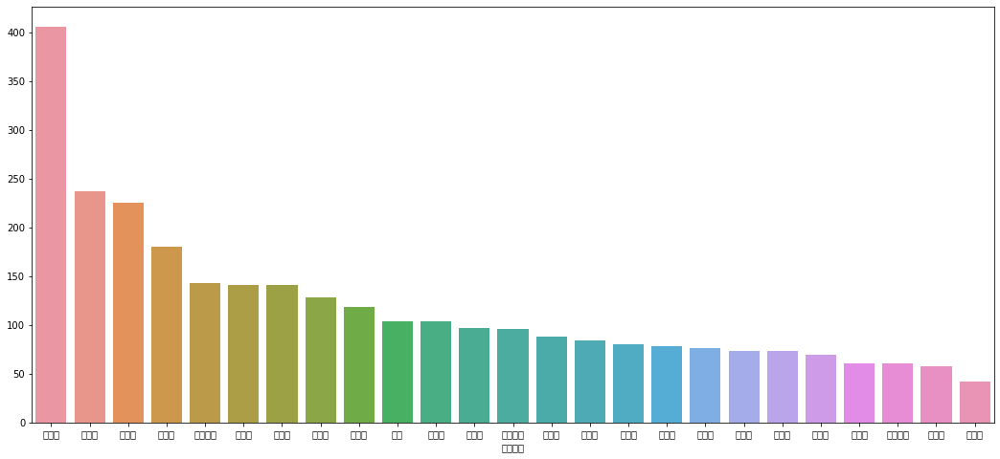

In [9]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#헬스장 서울 자치구별 분포 순위 구하기
gym_count_rank_sorted = filtered_gym_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#헬스장 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(gym_count_rank_sorted.index, gym_count_rank_sorted.values)
plt.show()


In [10]:
#헬스장 서울 자치구별 분포 순위 반영하여 표시하기
'''
강남은 퇴근 후 직장인들의 이미용, 피부과, 문화향유 등이 집중된 지역임에 따라 헬스장의 수도 많음
거주 인구 상위권인 송파 강서 등에서도 헬스장수가 많음
이례적으로 노원구는 거주인구 상위권임에도 헬스장수는 적은편, 경제적, 문화생활적 여건에서의 취약점을 드러냄
'''

#베이스맵 그리기
m31 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#헬스장 서울 자치구별 분포 순위 반영하여 표시하기
gym_count_rank = filtered_gym_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m31)

m31.choropleth(geo_data=seoul_geo,
             data=gym_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 헬스장 수'
            )

m31

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


### 영화관

#### 데이터 전처리

In [23]:
# #영화관 데이터셋 불러오기 
# movie_df = pd.read_csv('./영화관.csv')

# #데이터 전처리 
# movie_df = movie_df.loc[:,['poi_nm','branch_nm','mcate_nm','sgg_nm','x','y']] #필요한 데이터만 가져오기

# #프랜차이즈 영화관들 이름 재설정 : (EX) CGV -> CGV 수유점 
# movie_df['name']=movie_df['poi_nm']+' '+movie_df['branch_nm'].fillna('')

# #필요없는 컬럼 정리 
# del movie_df['poi_nm'] 
# del movie_df['branch_nm'] 

# # 컬럼 이름 정리 
# movie_df.rename(columns={'name':'poi_nm'}, inplace=True)

# #변수 이름 변경 
# movie_data['mcate_nm'].replace('메가박스','Megabox',inplace=True)
# movie_data['mcate_nm'].replace('롯데시네마','LotteCinema',inplace=True)
# movie_data['mcate_nm'].replace('일반극장/영화관','Theater',inplace=True)

# #최종 데이터
# movie_data = movie_df[['poi_nm','mcate_nm','sgg_nm','x','y']]

# #파일로 저장
# movie_data.to_csv('./movie_data_final.csv', index=False)


In [12]:
## 영화관 좌석수 데이터 전처리 

# 데이터 불러오기
seat_df_data = pd.read_excel('./EDA/movie_seat_data.xlsx') 
# 필요한 컬럼 선별
seat_df=seat_df_data[['기초단체','영화관명','총 좌석수']] 
# 컬럼병 변경
seat_df.columns = ['sgg_nm', 'poi_nm', 'seat_total'] 
# 컬럼 순서 변경
seat_data = seat_df[['poi_nm','sgg_nm','seat_total']]
# 전처리 완료 데이터 저장
seat_data.to_excel('./seat_data_final.xlsx',index=False) 

/var/folders/_m/cn5hgvpd2zv9jwrd8sdt55ch0000gn/T/ipykernel_4912/3841156913.py:4: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype=datetime64[ns])
  seat_df_data = pd.read_excel('./EDA/movie_seat_data.xlsx')


#### 영화관 데이터셋

In [13]:
# 전처리 완료한 파일 불러오기

movie_data = pd.read_csv('./EDA/movie_data_final.csv')
seat_data = pd.read_excel('./seat_data_final.xlsx')

#### 영화관 마커 맵

In [14]:
from folium import Marker
# base map 
m34 = folium.Map(location=[37.58, 127.0],tiles='openstreetmap', zoom_start=10)

for _, row in movie_data.iterrows():
    Marker(location = [row['y'], row['x']],
           popup=row['poi_nm'],
           icon=folium.Icon(color='blue',icon='star')
          ).add_to(m34)
m34

#### 영화관 히트맵

In [15]:
from folium.plugins import HeatMap
#베이스맵 그리기
m32 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

HeatMap(
    data=movie_data[['y', 'x']], 
    radius=25,
).add_to(m32)

m32

#### 자치구별 분포 표시

In [16]:
from folium import Marker
from folium.plugins import MarkerCluster

m33 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

mc = MarkerCluster()

for _, row in movie_data.iterrows():
    mc.add_child(    
        folium.Marker(location = [row['y'], row['x']],
               popup=row['poi_nm'])
    )

m33.add_child(mc)

In [17]:
'''
인사이트: 종로와 강남구에 영화관이 집중되어 있다.
종로는 대학가와 예술종사자들로 발전으로 인한 집중이며, 강남구는 유동인구가 많음에 따른 집중임
'''

import requests
import json

mcate= movie_data['sgg_nm'].value_counts() # 영화관 데이터 구별 count

m35 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=10)

# 서울 행정구역 json raw파일(githubcontent)
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m35)

m35.choropleth(geo_data=seoul_geo,
             data=mcate, 
             fill_color='YlOrRd', # 색 설정
             fill_opacity=0.5,
             line_opacity=1.2,
             key_on='properties.name',
             legend_name="지역구별 분포 파악"
             )
m35

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


#### 조건에 따른 분포 분석

##### 극장의 종류에 따른 분포 분석

findfont: Font family ['NanumGothic'] not found. Falling back to DejaVu Sans.


['NanumGothic']


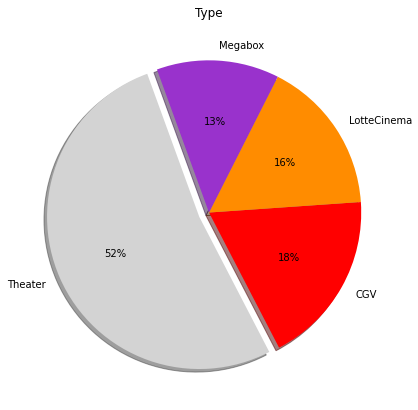

In [18]:
# 프랜차이즈와 기타 극장 비율 원그래프

#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

plt.figure(figsize=(7,7)) # 그래프 사이즈 설정
data = movie_data['mcate_nm'].value_counts() # data = 영화관 타입별 갯수
explodes =(0.07,0,0,0) # 중심에서의 거리
labels=['Theater','CGV','LotteCinema','Megabox'] # 라벨링
colors =['lightgray','r','darkorange','darkorchid'] # 컬러 지정

plt.pie(data, startangle=110,shadow=True,labels=labels,colors=colors,explode=explodes ,autopct='%.0f%%') 
# startangle : 각도, autopct : 퍼센트 설정
plt.title('Type')
plt.show()

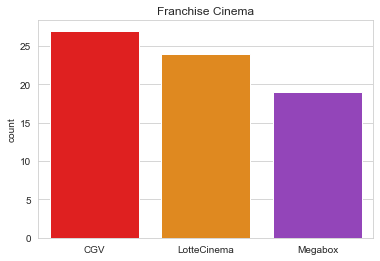

In [19]:
'''
프랜차이즈 영화관은 CGV와 롯데시네마가 다수의비중을 차지하고 있고 MEGABOX도 3번째로 많은 비중 차지함
'''
# Theater 제거후 프랜차이즈 영화관만 분석

fran_movie = movie_data[movie_data['mcate_nm']!='Theater'] #프랜차이즈 영화관만 데이터 지정

# 차트 설정
sns.set_style('whitegrid') # 차트 백경 설정
colors =['r','darkorange','darkorchid'] # 컬러 지정
c = sns.countplot(data=fran_movie, x='mcate_nm',palette=colors,              
                 order= fran_movie['mcate_nm'].value_counts().index) # 그래프 정렬
plt.title('Franchise Cinema') # 제목
c.set_xlabel('') #라벨 제거 
plt.show()

In [20]:
#영화관 위치 마커 표시하기
# 영화관별 분류
cgv = movie_data[movie_data['mcate_nm']=='CGV']
mega = movie_data[movie_data['mcate_nm']=='Megabox']
lotte = movie_data[movie_data['mcate_nm']=='LotteCinema']
nomal = movie_data[movie_data['mcate_nm']=='Theater']

from folium import Marker
# base map 
m36 = folium.Map(location=[37.58, 127.0],tiles='openstreetmap', zoom_start=10)

for _, row in cgv.iterrows():
    Marker(location = [row['y'], row['x']],
           popup=row['poi_nm'],
           icon=folium.Icon(color='r',icon='star')
          ).add_to(m36)
for _, row in mega.iterrows():
    Marker(location = [row['y'], row['x']],
           popup=row['poi_nm'],
           icon=folium.Icon(color='purple',icon='star')
          ).add_to(m36)
for _, row in lotte.iterrows():
    Marker(location = [row['y'], row['x']],
           popup=row['poi_nm'],
           icon=folium.Icon(color='orange',icon='star')
          ).add_to(m36)
for _, row in nomal.iterrows():
    Marker(location = [row['y'], row['x']],
           popup=row['poi_nm'],
           icon=folium.Icon(color='lightgray',icon='star')
          ).add_to(m36)
m36

/var/folders/_m/cn5hgvpd2zv9jwrd8sdt55ch0000gn/T/ipykernel_4912/943383919.py:15: UserWarning: color argument of Icon should be one of: {'gray', 'beige', 'lightgreen', 'darkblue', 'lightred', 'lightgray', 'green', 'cadetblue', 'pink', 'blue', 'darkpurple', 'purple', 'white', 'red', 'darkgreen', 'darkred', 'black', 'orange', 'lightblue'}.
  icon=folium.Icon(color='r',icon='star')


##### 영화관 좌석수에 따른 분포

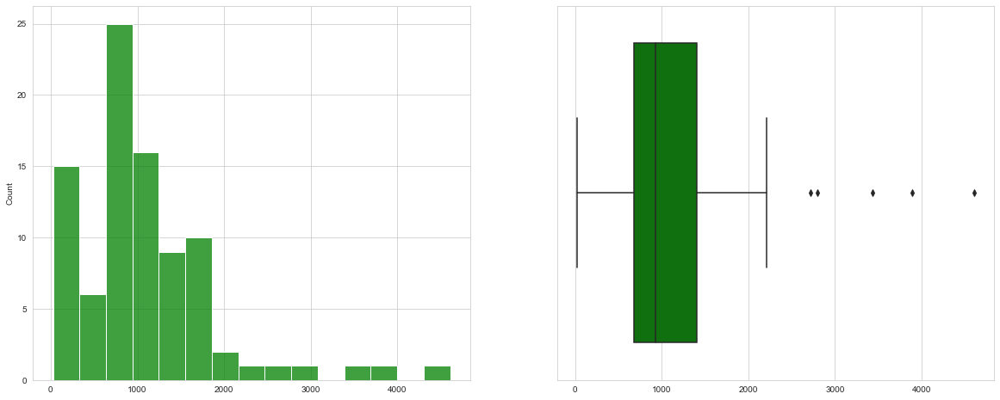

In [21]:
plt.figure(figsize=(20,8))

# histplot
plt.subplot(1,2,1) 
p=sns.histplot(data=seat_data, x='seat_total',color='green')
p.set_xlabel('')

# boxplot
plt.subplot(1,2,2) 
p=sns.boxplot(data=seat_data, x='seat_total',color='green')
p.set_xlabel('')

plt.show()

In [22]:
'''
상위 영화관은 유동인구와 방문자수가 많은 대형쇼핑몰(롯데월드타워,코엑스,영등포)에 입점되어 있음
'''
# TOP 5 영화관 위치 마커 표시하기


# Seat 상위 TOP5 영화관 추출하기 
seat_data[seat_data['seat_total']>2500].sort_values('seat_total',ascending=False)

movie_data[movie_data['poi_nm']=='롯데시네마 월드타워점']
movie_data[movie_data['poi_nm']=='CGV 용산아이파크몰점']
movie_data[movie_data['poi_nm']=='메가박스 코엑스점']
movie_data[movie_data['poi_nm']=='CGV 영등포점']
movie_data[movie_data['x']==126.9953472] 
movie_seat_top5_cinema = movie_data.take([106,11,65,127,121])
movie_seat_top5_cinema['seat_total']=4609,3893,3430,2797,2712

# TOP 5 영화관 위치 마커 표시
from folium import Marker
# base map 
m37 = folium.Map(location=[37.58, 127.0],tiles='openstreetmap', zoom_start=10)

for _, row in movie_seat_top5_cinema.iterrows():
    Marker(location = [row['y'], row['x']],
           popup=row['poi_nm'],
           icon=folium.Icon(color='green',icon='star')
          ).add_to(m37)
m37

##### 특수 상영관 갯수에 따른 분포

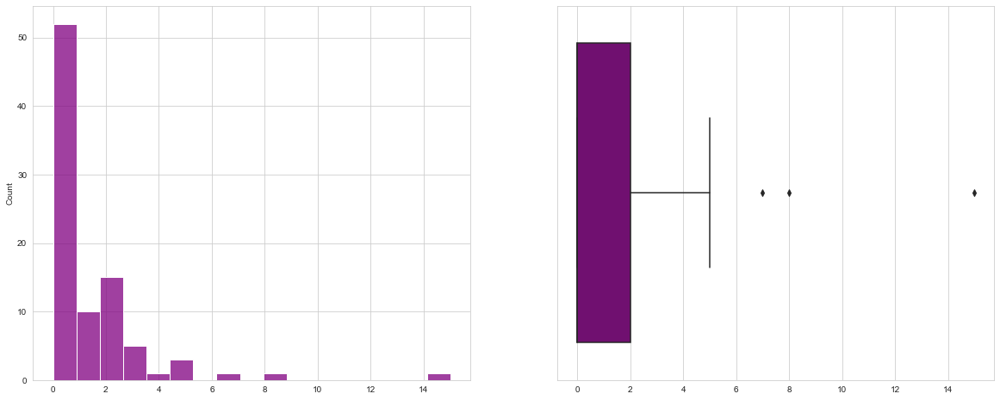

In [23]:
# 특수 상영관파악에 필요한 컬럼
spe_df = seat_df_data[['기초단체','영화관명','특수상영관 \n수']]
spe_df.columns = ['poi_nm','mcate_nm','special_screen']

# 특수 상영관 갯수에 따른 분포

plt.figure(figsize=(20,8))
# histplot
plt.subplot(1,2,1) 
p=sns.histplot(data=spe_df, x='special_screen',color='purple')
p.set_xlabel('')
# boxplot
plt.subplot(1,2,2) 
p=sns.boxplot(data=spe_df, x='special_screen',color='purple')
p.set_xlabel('')

plt.show()

In [24]:
# TOP 3 영화관 위치 마커 맵
# 특별상영관 TOP 3 추출하기
spe_top_df = spe_df[spe_df['special_screen']>5].sort_values('special_screen',ascending=False)

movie_data[movie_data['poi_nm']=='메가박스 코엑스점']
movie_data[movie_data['poi_nm']=='롯데시네마 월드타워점']
movie_data[movie_data['poi_nm']=='CGV 용산아이파크몰점']
special_top3_cinema = movie_data.take([65,106,11])

# TOP 3 영화관 위치 마커 표시
from folium import Marker
# base map 
m38 = folium.Map(location=[37.58, 127.0],tiles='openstreetmap', zoom_start=11)

for _, row in special_top3_cinema.iterrows():
    Marker(location = [row['y'], row['x']],
           popup=row['poi_nm'],
           icon=folium.Icon(color='purple',icon='star')
          ).add_to(m38)
m38

### 도서관

#### 도서관 데이터 셋

In [25]:
#도서관 데이터셋 불러오기
library_df = pd.read_csv('./EDA/library.csv')

#도서관 데이터셋 필요한 컬럼 정리
filtered_library_df = library_df[['fclt_name', 'rdnm_addr', 'x_cd', 'y_cd','sgnr_nm', 'buld_totar', 'usemem_nm', 'infl_factor']]
filtered_library_df.columns = ['시설명','주소', '위도', '경도', '자치구명','시설규모','연간이용자수','영향도지수']


#### 도서관 마커 맵

In [26]:
#베이스맵 그리기
m1 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#도서관 위치 마커로 표시하기
from folium import Marker

for _, row in filtered_library_df.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='book')
          ).add_to(m1)
    
m1

#### 도서관 히트맵

In [27]:
'''
인사이트: 강북에 도서관이 밀집되어 있고, 특히 노원에 도서관이 많이 밀집되어 있다
'''

#베이스맵 그리기
m2 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#도서관 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_library_df[['위도', '경도']], 
    radius=25,
).add_to(m2)

m2

#### 서울 자치구별 분포 표시

In [28]:
#베이스맵 그리기
m3 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#도서관 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m3)

#도서관 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m3)

for lat, long in zip(filtered_library_df['위도'], filtered_library_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='book')).add_to(marker_cluster)
    
m3

#### 서울 자치구별 분포 순위

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
findfont: Font family ['NanumGothic'] not found. Falling back to DejaVu Sans.


['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49569 (\N{HANGUL SYLLABLE SONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54028 (\N{HANGUL SYLLABLE PA}) missing from curren

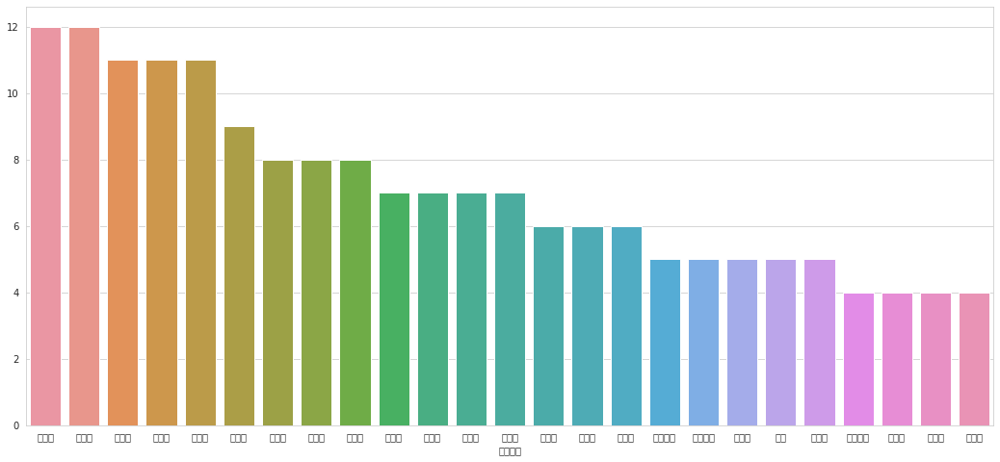

In [29]:
#도서관 서울 자치구별 분포 순위 구하기

#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#도서관 서울 자치구별 분포 순위 구하기
library_count_rank_sorted = filtered_library_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#도서관 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(library_count_rank_sorted.index, library_count_rank_sorted.values)
plt.show()

In [30]:
#도서관 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m4 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#도서관 서울 자치구별 분포 순위 반영하여 표시하기
library_count_rank = filtered_library_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m4)

m4.choropleth(geo_data=seoul_geo,
             data=library_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 도서관 수'
            )

m4

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


#### 조건에 따른 top5 시설 출력

##### 시설규모

<AxesSubplot:xlabel='시설규모', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49444 (\N{HANGUL SYLLABLE SEOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44508 (\N{HANGUL SYLLABLE GYU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


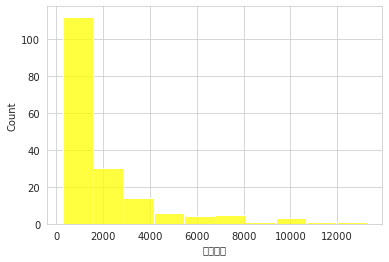

In [31]:
#조건에 따른 top5 시설 출력: 시설규모

#도서관 시설규모에 따른 분포
sns.histplot(data=filtered_library_df, x='시설규모', bins = 10, color='yellow')

In [32]:
#조건에 따른 top5 시설 출력: 시설규모

#시설규모 top5 구하기
library_scale_top5 = filtered_library_df['시설규모'].sort_values(ascending=False).head(5).values
library_scale_rank = filtered_library_df[filtered_library_df['시설규모'].isin(library_scale_top5)]
library_scale_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
11,서울특별시교육청마포평생학습관,서울특별시 마포구 마포대로 224,37.553844,126.957221,마포구,9716,1240706,0.007831
17,서울특별시교육청남산도서관,서울특별시 용산구 소월로 109,37.552556,126.982158,용산구,9410,1072250,0.008776
20,서울특별시교육청정독도서관,서울특별시 종로구 북촌로5길 48,37.581266,126.983870,종로구,13266,1584679,0.008371
102,마포중앙도서관,서울특별시 마포구 성산로 128,37.563795,126.908202,마포구,11234,1109240,0.010128
155,서울도서관,서울특별시 중구 세종대로 110,37.566317,126.977829,중구,9499,996107,0.009536


In [33]:
#조건에 따른 top5 시설 출력: 시설규모

#베이스맵 그리기
m5 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=12)

#도서관 위치 마커로 표시하기
for _, row in library_scale_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='beige', icon='book')
          ).add_to(m5)
    
m5

##### 연간이용자수

<AxesSubplot:xlabel='연간이용자수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50672 (\N{HANGUL SYLLABLE YEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50857 (\N{HANGUL SYLLABLE YONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from current

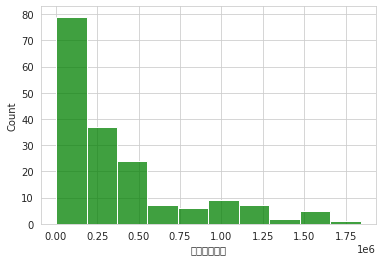

In [34]:
#조건에 따른 top5 시설 출력: 연간이용자수

#도서관 연간이용자수에 따른 분포
sns.histplot(data=filtered_library_df, x='연간이용자수', bins = 10, color='green')

In [35]:
#조건에 따른 top5 시설 출력: 연간이용자수

#연간이용자수 top5 구하기
library_user_top5 = filtered_library_df['연간이용자수'].sort_values(ascending=False).head(5).values
library_user_rank = filtered_library_df[filtered_library_df['연간이용자수'].isin(library_user_top5)]
library_user_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
14,서울특별시교육청송파도서관,서울특별시 송파구 동남로 263,37.499995,127.134851,송파구,8260,1838885,0.004492
15,서울특별시교육청양천도서관,서울특별시 양천구 목동서로 113,37.533560,126.876231,양천구,6864,1610741,0.004261
20,서울특별시교육청정독도서관,서울특별시 종로구 북촌로5길 48,37.581266,126.983870,종로구,13266,1584679,0.008371
61,광진정보도서관,서울특별시 광진구 아차산로78길 90,37.551073,127.110615,광진구,7283,1554970,0.004684
159,중랑구립정보도서관,서울특별시 중랑구 신내로15길 197,37.615171,127.086906,중랑구,5106,1531490,0.003334


In [36]:
'''
연간 이용자가 많은 도서관은 구별로 흩어져 있다. 
연간이용자 수는 규모보다 거주인구가 많은 지역과 관계가 있어 보인다
'''

#조건에 따른 top5 시설 출력: 연간이용자수

#베이스맵 그리기
m6 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=12)

#도서관 위치 마커로 표시하기
for _, row in library_user_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='green', icon='book')
          ).add_to(m6)
    
m6

##### 영향도지수

<AxesSubplot:xlabel='영향도지수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50689 (\N{HANGUL SYLLABLE YEONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54693 (\N{HANGUL SYLLABLE HYANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from curre

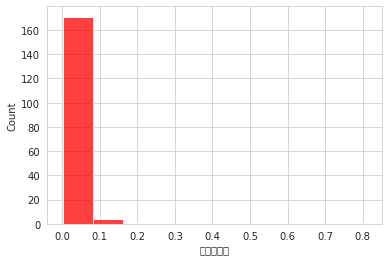

In [37]:
#조건에 따른 top5 시설 출력: 영향도지수

#도서관 영향도지수에 따른 분포
sns.histplot(data=filtered_library_df, x='영향도지수', bins = 10, color='red')

In [38]:
#조건에 따른 top5 시설 출력: 영향도지수

#영향도지수 top5 구하기
library_infl_top5 = filtered_library_df['영향도지수'].sort_values(ascending=False).head(5).values
library_infl_rank = filtered_library_df[filtered_library_df['영향도지수'].isin(library_infl_top5)]
library_infl_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
25,4.19 혁명기념 도서관,서울특별시 종로구 새문안로 17,37.567445,126.967694,종로구,7301,9000,0.811222
26,한국학생도서관,서울특별시 중구 동호로27길 30,37.560704,127.002151,중구,595,3200,0.185938
151,어린이청소년국학도서관,서울특별시 종로구 명륜길 26,37.588686,126.995540,종로구,511,3428,0.149067
163,쌍문채움도서관,서울특별시 도봉구 우이천로 340,37.647042,127.026230,도봉구,687,4724,0.145428
168,성북길빛도서관,서울특별시 성북구 숭인로8길 52,37.609959,127.026441,성북구,1397,9504,0.146991


In [39]:
'''
영향력 있는 도서관 1-2위는 역사적의미가 있는 도서관이다
4.19 혁명 도서관은 기념해서 만든 도서관이며, 한국 학생도서관은 최초의 공공도서관으로, 
외국학생을 통한 도서수집 운동을 전개하여 약 30만권 도입해 전국 대학에 균배활동을 한 역사가 있는 도서관이다
'''

#조건에 따른 top5 시설 출력: 영향도지수

#베이스맵 그리기
m7 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=12)

#도서관 위치 마커로 표시하기
for _, row in library_infl_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red', icon='book')
          ).add_to(m7)
    
m7

### 박물관

#### 박물관 데이터셋

In [40]:
#박물관 데이터셋 불러오기
museum_df = pd.read_csv('./EDA/museum.csv')

#박물관 데이터셋 필요한 컬럼 정리
filtered_museum_df = museum_df[['fclt_name', 'rdnm_addr', 'x_cd', 'y_cd','sgnr_nm', 'buld_totar', 'usemem_nm', 'infl_factor']]
filtered_museum_df.columns = ['시설명','주소', '위도', '경도', '자치구명','시설규모','연간이용자수','영향도지수']


#### 박물관 마커 맵

In [41]:
#베이스맵 그리기
m8 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#박물관 위치 마커로 표시하기
from folium import Marker

for _, row in filtered_museum_df.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='info-sign')
          ).add_to(m8)
    
m8

#### 박물관 히트맵

In [42]:
#베이스맵 그리기
m9 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#박물관 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_museum_df[['위도', '경도']], 
    radius=25,
).add_to(m9)

m9

#### 서울 자치구별 분포 표시

In [43]:
'''
뮤지엄은 종로구에만 28개로 밀집되어 있고
경찰박물관,미술관,고궁박물관 등 다양한 뮤지엄이 있다.
'''

#베이스맵 그리기
m10 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#뮤지엄 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m10)

#뮤지엄 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m10)

for lat, long in zip(filtered_museum_df['위도'], filtered_museum_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='info-sign')).add_to(marker_cluster)
    
m10

#### 서울 자치구별 분포 순위

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/

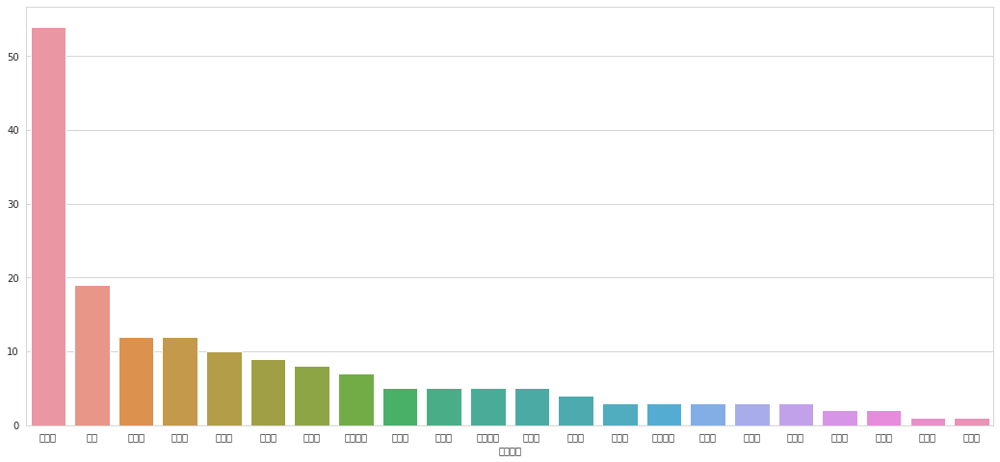

In [44]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline


#뮤지엄 서울 자치구별 분포 순위 구하기
museum_count_rank_sorted = filtered_museum_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#뮤지엄 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(museum_count_rank_sorted.index, museum_count_rank_sorted.values)
plt.show()

In [45]:
#뮤지엄 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m11 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#뮤지엄 서울 자치구별 분포 순위 반영하여 표시하기
museum_count_rank = filtered_museum_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m11)

m11.choropleth(geo_data=seoul_geo,
             data=museum_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 뮤지엄 수'
            )

m11

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


#### 조건에 따른 top5 시설 출력

##### 시설규묘

<AxesSubplot:xlabel='시설규모', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49444 (\N{HANGUL SYLLABLE SEOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44508 (\N{HANGUL SYLLABLE GYU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


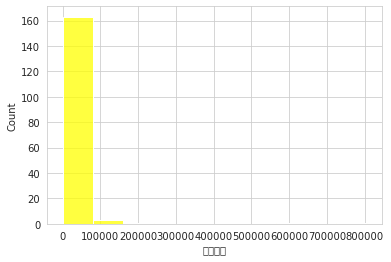

In [46]:
#뮤지엄 시설규모에 따른 분포
sns.histplot(data=filtered_museum_df, x='시설규모', bins = 10, color='yellow')

In [47]:
#조건에 따른 top5 시설 출력: 시설규모

#시설규모 top5 구하기
museum_scale_top5 = filtered_museum_df['시설규모'].sort_values(ascending=False).head(5).values
museum_scale_rank = filtered_museum_df[filtered_museum_df['시설규모'].isin(museum_scale_top5)]
museum_scale_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
0,국립중앙박물관,서울 용산구 서빙고로 137,37.524702,126.977740,용산구,138156.0,3354161.0,0.041189
41,롯데월드민속박물관,서울 송파구 올림픽로 240,37.511310,127.098142,송파구,583288.0,83847.0,2.430367
113,서울여자대학교 박물관,서울 노원구 화랑로 621,37.628783,127.088992,노원구,135683.0,7500.0,27.136600
154,아모레퍼시픽미술관,서울 용산구 한강대로 100,37.528791,126.968674,용산구,188902.0,1807.0,2.698600
170,롯데뮤지엄,서울 송파구 올림픽로 300,37.513752,127.104447,송파구,805872.0,460.0,4.740424


In [48]:
#조건에 따른 top5 시설 출력: 시설규모

#베이스맵 그리기
m12 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#뮤지엄 위치 마커로 표시하기
for _, row in museum_scale_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='beige', icon='info-sign')
          ).add_to(m12)
    
m12

##### 연간이용자수

<AxesSubplot:xlabel='연간이용자수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50672 (\N{HANGUL SYLLABLE YEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50857 (\N{HANGUL SYLLABLE YONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from current

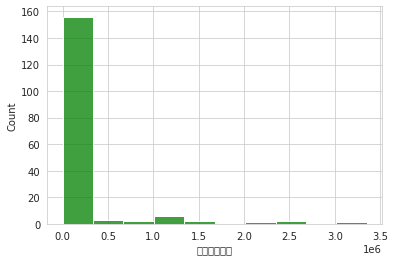

In [49]:
#뮤지엄 연간이용자수에 따른 분포
sns.histplot(data=filtered_museum_df, x='연간이용자수', bins = 10, color='green')

In [50]:
#조건에 따른 top20 시설 출력: 연간이용자수

#연간이용자수 top20 구하기
museum_user_top5 = filtered_museum_df['연간이용자수'].sort_values(ascending=False).head(5).values
museum_user_rank = filtered_museum_df[filtered_museum_df['연간이용자수'].isin(museum_user_top5)]
museum_user_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
0,국립중앙박물관,서울 용산구 서빙고로 137,37.524702,126.977740,용산구,138156.00,3354161.0,0.041189
1,국립민속박물관,서울 종로구 삼청로 37,37.579485,126.978764,종로구,20195.00,2413596.0,0.008833
2,대한민국역사박물관,서울 종로구 세종대로 198,37.573714,126.978339,종로구,11117.39,2379672.0,0.010499
3,국립한글박물관,서울 용산구 서빙고로 139,37.521069,126.980486,용산구,11767.29,2286276.0,0.015153
4,국립국악원 국악박물관,서울 서초구 남부순환로 2364,37.477719,127.009818,서초구,3899.00,1423500.0,0.094595


In [51]:
#조건에 따른 top20 시설 출력: 연간이용자수
'''
연간이용자수의 상위권을 차지하는 뮤지엄은 대다수가 국공립시설
시민들의 문화예술 향유의 갈래 중 전시관람과 관련해서는 국가의 지원여부가 여전히 상당한 영향을 끼침을 알 수 있음
또한 해당시설의 상당수는 과거 국공립뮤지엄 건립이 광화문 중심으로 이루어진 결과로 광화문 일대에 집중되어있음
'''

#베이스맵 그리기
m13 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#뮤지엄 위치 마커로 표시하기
for _, row in museum_user_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='green', icon='info-sign')
          ).add_to(m13)
    
m13

##### 영향도지수

<AxesSubplot:xlabel='영향도지수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50689 (\N{HANGUL SYLLABLE YEONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54693 (\N{HANGUL SYLLABLE HYANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from curre

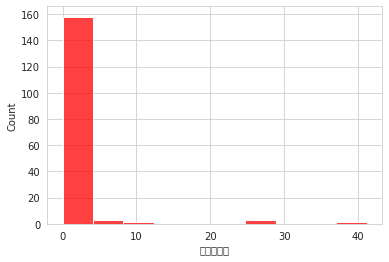

In [52]:
#뮤지엄 영향도지수에 따른 분포
sns.histplot(data=filtered_museum_df, x='영향도지수', bins = 10, color='red')

In [53]:
#조건에 따른 top5 시설 출력: 영향도지수

#영향도지수 top5 구하기
museum_infl_top5 = filtered_museum_df['영향도지수'].sort_values(ascending=False).head(6).values
museum_infl_rank = filtered_museum_df[filtered_museum_df['영향도지수'].isin(museum_infl_top5)]
museum_infl_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
33,고촌이종근기념관,서울 서대문구 충정로 8,37.559678,126.963202,서대문구,22527.0,129712.0,6.931385
34,관문사 성보박물관,서울 서초구 바우뫼로7길 111,37.473750,127.022282,서초구,21647.0,128092.0,10.823500
110,서울대학교 치의학대학원 치의학박물관,서울 종로구 대학로 101,37.580452,126.997196,종로구,12093.0,8708.0,26.289130
113,서울여자대학교 박물관,서울 노원구 화랑로 621,37.628783,127.088992,노원구,135683.0,7500.0,27.136600
116,성신여자대학교 자연사박물관,서울 강북구 도봉로76가길 55,37.631950,127.027268,강북구,75933.0,6540.0,28.354369
117,성신여자대학교 정원박광훈복식박물관,서울 강북구 도봉로76가길 55,37.631950,127.027268,강북구,75933.0,6155.0,41.156098


In [54]:
#조건에 따른 top5 시설 출력: 영향도지수
'''
단위면적당 방문자수의 비례정도를 비교해본 영향도 지수에서 상위를 차지한 뮤지엄들은 단체나 기관에 속해있는 시설들이 전부였기 때문에,
(전체시설이용자와 뮤지엄이용자의 명확한 구분이 어려워)
해당 비교 시도는 유의미한 결과값을 나타낸다고 보기 어려움
'''

#베이스맵 그리기
m14 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#뮤지엄 위치 마커로 표시하기
for _, row in museum_infl_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red', icon='info-sign')
          ).add_to(m14)
    
m14

### 공연장

#### 공연장 데이터셋

In [55]:
#공연장 데이터셋 불러오기
hall_df = pd.read_csv('./EDA/concert_hall.csv')

#공연장 데이터셋 필요한 컬럼 정리
filtered_hall_df = hall_df[['FCLT_NAME', 'ADSTRD_NM', 'X_CD', 'Y_CD','SGNR_NM', 'SEAT_CAPA','PRF_CNT','TOT_ADVTK_CNT']]
filtered_hall_df.columns = ['시설명','주소', '위도', '경도', '자치구명', '좌석수', '공연건수', '예매건수']

#### 공연장 마커 맵

In [56]:
#베이스맵 그리기
m15 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공연장 위치 마커로 표시하기
from folium import Marker

for _, row in filtered_hall_df.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='flag')
          ).add_to(m15)
    
m15

#### 공연장 히트맵

In [57]:
'''
인사이트:
공연장은 혜화역 근처 대학로 중심으로
작은공연장이 밀집되어 있는것을 알 수 있다.
두번째로는 강남구에 밀집되어 있다.
'''

#베이스맵 그리기
m16 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공연장 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_hall_df[['위도', '경도']], 
    radius=25,
).add_to(m16)

m16

#### 서울 자치구별 분포 표시

In [58]:
#베이스맵 그리기
m17 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공연장 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m17)

#공연장 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m17)

for lat, long in zip(filtered_hall_df['위도'], filtered_hall_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='flag')).add_to(marker_cluster)
    
m17

#### 서울 자치구별 분포 순위

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/

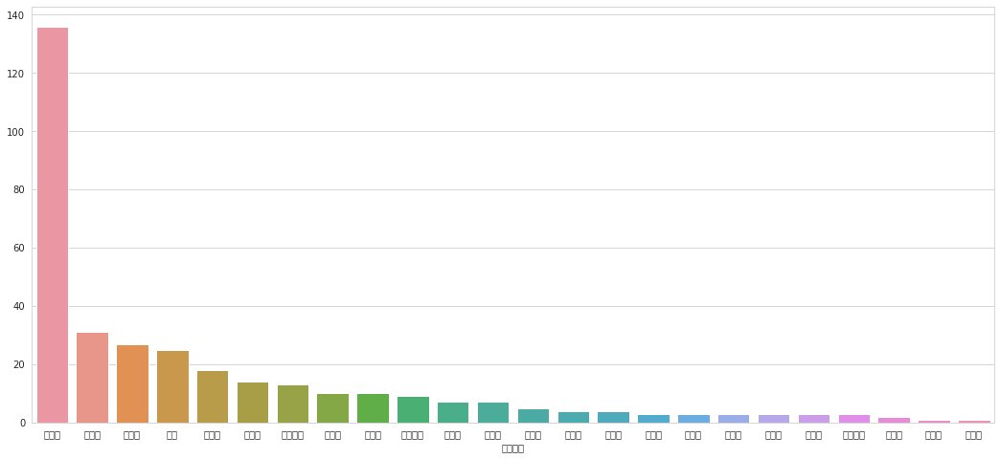

In [59]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#공연장 서울 자치구별 분포 순위 구하기
hall_count_rank_sorted = filtered_hall_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#공연장 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(hall_count_rank_sorted.index, hall_count_rank_sorted.values)
plt.show()

In [60]:
#공연장 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m18 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공연장 서울 자치구별 분포 순위 반영하여 표시하기
hall_count_rank = filtered_hall_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m18)

m18.choropleth(geo_data=seoul_geo,
             data=hall_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 공연장 수'
            )

m18

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


#### 조건에 따른 top5 시설 출력

##### 좌석수

<AxesSubplot:xlabel='좌석수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51340 (\N{HANGUL SYLLABLE JWA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49437 (\N{HANGUL SYLLABLE SEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


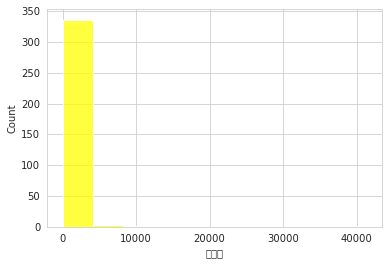

In [61]:
#공연장 좌석수에 따른 분포
sns.histplot(data=filtered_hall_df, x='좌석수', bins = 10, color='yellow')

In [62]:
#조건에 따른 top5 시설 출력: 좌석수

#좌석수 top5 구하기
hall_scale_top5 = filtered_hall_df['좌석수'].sort_values(ascending=False).head(5).values
hall_scale_rank = filtered_hall_df[filtered_hall_df['좌석수'].isin(hall_scale_top5)]
hall_scale_rank

,시설명,주소,위도,경도,자치구명,좌석수,공연건수,예매건수
129,문화비축기지,성산2동,37.571607,126.895369,마포구,11180,2,106
248,예술의전당,서초3동,37.478690,127.011824,서초구,8139,525,517046
254,올림픽공원,오륜동,37.521120,127.128364,송파구,41376,3,7589
277,장충체육관,장충동,37.558172,127.006718,중구,4507,1,61
298,코엑스,삼성1동,37.511683,127.059108,강남구,11338,5,20940


In [63]:
'''
인사이트:
좌석수 기준 많은 인원을 수용할수 있는 공연장임에도
공연건수가 얼마 되지 않는게 안타깝다
'''

#조건에 따른 top5 시설 출력: 좌석수

#베이스맵 그리기
m19 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공연장 위치 마커로 표시하기
for _, row in hall_scale_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='beige', icon='flag')
          ).add_to(m19)
    
m19

##### 공연건수

<AxesSubplot:xlabel='공연건수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44277 (\N{HANGUL SYLLABLE GONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50672 (\N{HANGUL SYLLABLE YEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44148 (\N{HANGUL SYLLABLE GEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


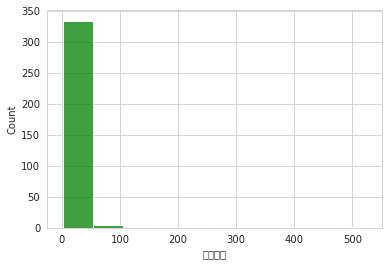

In [64]:
#공연장 공연건수에 따른 분포
sns.histplot(data=filtered_hall_df, x='공연건수', bins = 10, color='green')

In [65]:
#조건에 따른 top5 시설 출력: 공연건수

#공연건수 top5 구하기
hall_freq_top5 = filtered_hall_df['공연건수'].sort_values(ascending=False).head(5).values
hall_freq_rank = filtered_hall_df[filtered_hall_df['공연건수'].isin(hall_freq_top5)]
hall_freq_rank

,시설명,주소,위도,경도,자치구명,좌석수,공연건수,예매건수
57,금호아트홀 연세,신촌동,37.564089,126.938981,서대문구,390,241,5718
112,롯데콘서트홀,잠실6동,37.513061,127.103495,송파구,2036,139,64467
184,세종문화회관,사직동,37.572525,126.975643,종로구,4374,250,332188
240,영산아트홀,여의동,37.529231,126.924872,영등포구,598,105,4990
248,예술의전당,서초3동,37.478690,127.011824,서초구,8139,525,517046


In [66]:
'''
인사이트: 공연건수가 많은 곳은 
클래식 등 음악공연을 하는 곳이라는 것을 알 수 있다.
'''

#조건에 따른 top5 시설 출력: 공연건수

#베이스맵 그리기
m20 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공연장 위치 마커로 표시하기
for _, row in hall_freq_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='green', icon='flag')
          ).add_to(m20)
    
m20

##### 예매건수

<AxesSubplot:xlabel='예매건수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50696 (\N{HANGUL SYLLABLE YE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47588 (\N{HANGUL SYLLABLE MAE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44148 (\N{HANGUL SYLLABLE GEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


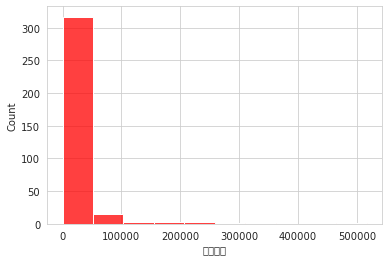

In [67]:
#공연장 예매건수에 따른 분포
sns.histplot(data=filtered_hall_df, x='예매건수', bins = 10, color='red')

In [68]:
#조건에 따른 top5 시설 출력: 예매건수

#예매건수 top5 구하기
hall_user_top5 = filtered_hall_df['예매건수'].sort_values(ascending=False).head(5).values
hall_user_rank = filtered_hall_df[filtered_hall_df['예매건수'].isin(hall_user_top5)]
hall_user_rank

,시설명,주소,위도,경도,자치구명,좌석수,공연건수,예매건수
151,블루스퀘어,한남동,37.540872,127.002440,용산구,3405,5,286899
157,샤롯데씨어터,잠실3동,37.510516,127.100563,송파구,1241,4,242679
184,세종문화회관,사직동,37.572525,126.975643,종로구,4374,250,332188
248,예술의전당,서초3동,37.478690,127.011824,서초구,8139,525,517046
293,충무아트센터,신당동,37.566014,127.014813,중구,1998,15,230062


In [69]:
#조건에 따른 top5 시설 출력: 예매건수

#베이스맵 그리기
m21 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공연장 위치 마커로 표시하기
for _, row in hall_user_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red', icon='flag')
          ).add_to(m21)
    
m21

### 공공문화시설

#### 공공문화시설 데이터셋

In [70]:
#공공문화시설 데이터셋 불러오기
public_df = pd.read_csv('./EDA/public.csv')

#공공문화시설 데이터셋 필요한 컬럼 정리
filtered_public_df = public_df[['fclt_name', 'rdnm_addr', 'x_cd', 'y_cd','sgnr_nm', 'buld_totar', 'usemem_nm', 'infl_factor']]
filtered_public_df.columns = ['시설명','주소', '위도', '경도', '자치구명','시설규모','연간이용자수','영향도지수']

#### 공공문화시설 마커 맵

In [71]:
#베이스맵 그리기
m22 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공공문화시설 위치 마커로 표시하기
from folium import Marker

for _, row in filtered_public_df.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='home')
          ).add_to(m22)
    
m22

#### 공공문화시설 히트맵

In [72]:
#베이스맵 그리기
m23 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공공문화시설 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_public_df[['위도', '경도']], 
    radius=25,
).add_to(m23)

m23

#### 자치구별 분포 표시

In [73]:
'''
인사이트: 공공문화시설이 많은 지역은 종로구와 은평구로 노년인구가 많은 지역에 밀집됨
'''

#베이스맵 그리기
m24 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공공문화시설 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m24)

#공공문화시설 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m24)

for lat, long in zip(filtered_public_df['위도'], filtered_public_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='home')).add_to(marker_cluster)
    
m24

#### 자치구별 분포 순위

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/

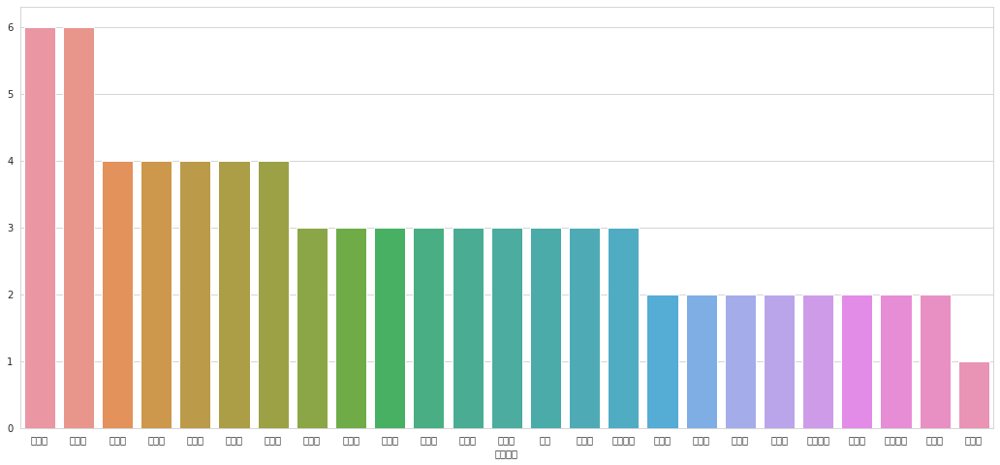

In [74]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#공공문화시설 서울 자치구별 분포 순위 구하기
public_count_rank_sorted = filtered_public_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#공공문화시설 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(public_count_rank_sorted.index, public_count_rank_sorted.values)
plt.show()

In [75]:
#공공문화시설 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m25 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공공문화시설 서울 자치구별 분포 순위 반영하여 표시하기
public_count_rank = filtered_public_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m25)

m25.choropleth(geo_data=seoul_geo,
             data=public_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 공공문화시설 수'
            )

m25

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


#### 조건에 따른 top5 시설 출력

##### 시설규모

<AxesSubplot:xlabel='시설규모', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49444 (\N{HANGUL SYLLABLE SEOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44508 (\N{HANGUL SYLLABLE GYU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


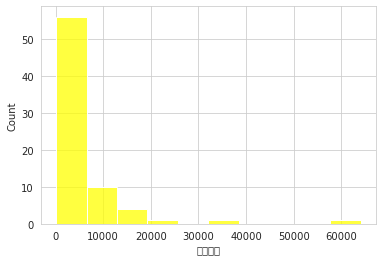

In [76]:
#공공문화시설 시설규모에 따른 분포
sns.histplot(data=filtered_public_df, x='시설규모', bins = 10, color='yellow')

In [77]:
#시설규모 top5 구하기
public_scale_top5 = filtered_public_df['시설규모'].sort_values(ascending=False).head(5).values
public_scale_rank = filtered_public_df[filtered_public_df['시설규모'].isin(public_scale_top5)]
public_scale_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
0,강동아트센터,서울 강동구 동남로 870,37.551220,127.157342,강동구,18051.0,113310.0,0.159306
3,나루아트센터,서울 광진구 능동로 76,37.537571,127.070576,광진구,18860.5,35564.0,0.530326
7,마포아트센터,서울 마포구 대흥로20길 28,37.549906,126.945534,마포구,19756.0,98552.0,0.200463
16,충무아트센터,서울 중구 퇴계로 387,37.565941,127.014791,중구,36726.8,298610.0,0.122993
18,재단법인 세종문화회관,서울 종로구 세종대로 175,37.571848,126.976168,종로구,64058.0,2125067.0,0.030144


In [78]:
'''
인사이트: 공공문화시설의 영향도는 시설규모보다
주거지역 밀집한 곳(도봉구,광진구,양천구)에 공공문화시설이 높은 것을 파악
'''

#조건에 따른 top5 시설 출력: 시설규모

#베이스맵 그리기
m26 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=12)

#공공문화시설 위치 마커로 표시하기
for _, row in public_scale_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='beige', icon='home')
          ).add_to(m26)
    
m26

##### 연간이용자수

<AxesSubplot:xlabel='연간이용자수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50672 (\N{HANGUL SYLLABLE YEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50857 (\N{HANGUL SYLLABLE YONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from current

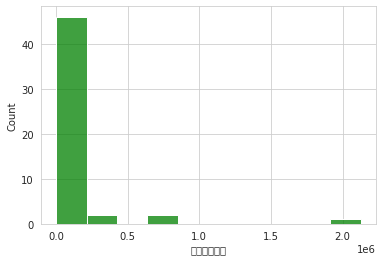

In [79]:
#공공문화시설 연간이용자수에 따른 분포
sns.histplot(data=filtered_public_df, x='연간이용자수', bins = 10, color='green')

In [80]:
#조건에 따른 top5 시설 출력: 연간이용자수

#연간이용자수 top5 구하기
public_user_top5 = filtered_public_df['연간이용자수'].sort_values(ascending=False).head(5).values
public_user_rank = filtered_public_df[filtered_public_df['연간이용자수'].isin(public_user_top5)]
public_user_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
16,충무아트센터,서울 중구 퇴계로 387,37.565941,127.014791,중구,36726.80,298610.0,0.122993
18,재단법인 세종문화회관,서울 종로구 세종대로 175,37.571848,126.976168,종로구,64058.00,2125067.0,0.030144
31,노원문화원,서울 노원구 동일로197길 24,37.628799,127.069801,노원구,586.59,674704.0,0.000869
34,마포문화원,서울 마포구 백범로 227,37.542230,126.955491,마포구,1462.54,688997.0,0.002123
39,영등포문화원,서울 영등포구 신길로 275,37.516127,126.912126,영등포구,3357.00,407344.0,0.008241


In [81]:
#조건에 따른 top5 시설 출력: 연간이용자수

#베이스맵 그리기
m27 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=12)

#공공문화시설 위치 마커로 표시하기
for _, row in public_user_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='green', icon='home')
          ).add_to(m27)
    
m27

##### 영향도지수

<AxesSubplot:xlabel='영향도지수', ylabel='Count'>

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50689 (\N{HANGUL SYLLABLE YEONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54693 (\N{HANGUL SYLLABLE HYANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from curre

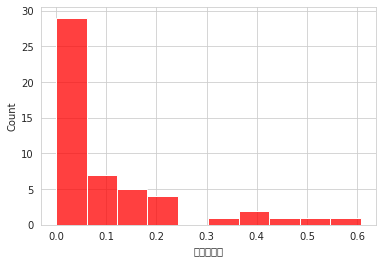

In [82]:
#공공문화시설 영향도지수에 따른 분포
sns.histplot(data=filtered_public_df, x='영향도지수', bins = 10, color='red')

In [83]:
#조건에 따른 top5 시설 출력: 영향도지수

#영향도지수 top5 구하기
public_infl_top5 = filtered_public_df['영향도지수'].sort_values(ascending=False).head(5).values
public_infl_rank = filtered_public_df[filtered_public_df['영향도지수'].isin(public_infl_top5)]
public_infl_rank

,시설명,주소,위도,경도,자치구명,시설규모,연간이용자수,영향도지수
2,관악문화관,서울 관악구 신림로3길 35,37.467598,126.944871,관악구,15614.85,40297.0,0.387494
3,나루아트센터,서울 광진구 능동로 76,37.537571,127.070576,광진구,18860.50,35564.0,0.530326
11,성수문화복지회관,서울 성동구 뚝섬로1길 43,37.545429,127.046948,성동구,9727.00,22620.0,0.430018
20,도봉구민회관,서울 도봉구 도봉로 552,37.654103,127.038627,도봉구,10107.00,16660.0,0.606663
75,목2동문화의집,서울 양천구 목동중앙본로 120,37.546144,126.871702,양천구,831.60,2000.0,0.415800


In [84]:
#조건에 따른 top5 시설 출력: 영향도지수

#베이스맵 그리기
m28 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공공문화시설 위치 마커로 표시하기
for _, row in public_infl_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red', icon='home')
          ).add_to(m28)
    
m28

### 서점

#### 서점 데이터셋

In [85]:
#서점 데이터셋 불러오기
bookstore_df = pd.read_csv('./EDA/bookstore.csv', encoding = 'cp949')

#서점 데이터셋 필요한 컬럼 정리
filtered_bookstore_df = bookstore_df[['책방 이름','주소', '구 이름', '위도', '경도', '책방 구분명']]
filtered_bookstore_df.columns = ['시설명','주소', '자치구명', '위도', '경도', '서점구분']

#### 헌책방 새책방 구분 마커맵

In [86]:
'''
헌책방 현황을 통해 과거 청계천로, 현재 합정의 중심의 유통 특성 확인 가능
그외 서울 외곽부 위주로 분포
이례적으로 서울 중심부나 강남등에서 확인되는 헌책방은 yes24, 알라딘 등의 전략적인 오프라인 사업지인 경우 많음
'''

#베이스맵 그리기
m39 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#시설종류에 따라 그룹화
from folium import Map, FeatureGroup, Marker, LayerControl, plugins
gs = folium.FeatureGroup(name='Groups', control=False)
m39.add_child(gs)
g1 = folium.plugins.FeatureGroupSubGroup(gs, '새책방')
m39.add_child(g1)
g2 = folium.plugins.FeatureGroupSubGroup(gs, '헌책방')
m39.add_child(g2)

#서점 위치 마커로 표시하기
for _, row in filtered_bookstore_df[filtered_bookstore_df['서점구분'].str.contains('새책방')].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='book')
          ).add_to(g1)
for _, row in filtered_bookstore_df[filtered_bookstore_df['서점구분'].str.contains('헌책방')].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red',icon='book')
          ).add_to(g2)
    
folium.LayerControl(collapsed=False).add_to(m39)

m39

#### 서점 히트맵

In [87]:
#베이스맵 그리기
m40 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#서점 분포 히트맵으로 표시하기, 시각적으로 특징점 드러내기위해 radius=17으로 지정함
from folium.plugins import HeatMap

HeatMap(
    data=filtered_bookstore_df[['위도', '경도']], 
    radius=17,
).add_to(m40)

m40

#### 자치구별 분포 표시

In [88]:
#베이스맵 그리기
m41 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#서점 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m41)

#서점 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m41)

for lat, long in zip(filtered_bookstore_df['위도'], filtered_bookstore_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='book')).add_to(marker_cluster)
    
m41

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47560 (\N{HANGUL SYLLABLE MA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/li

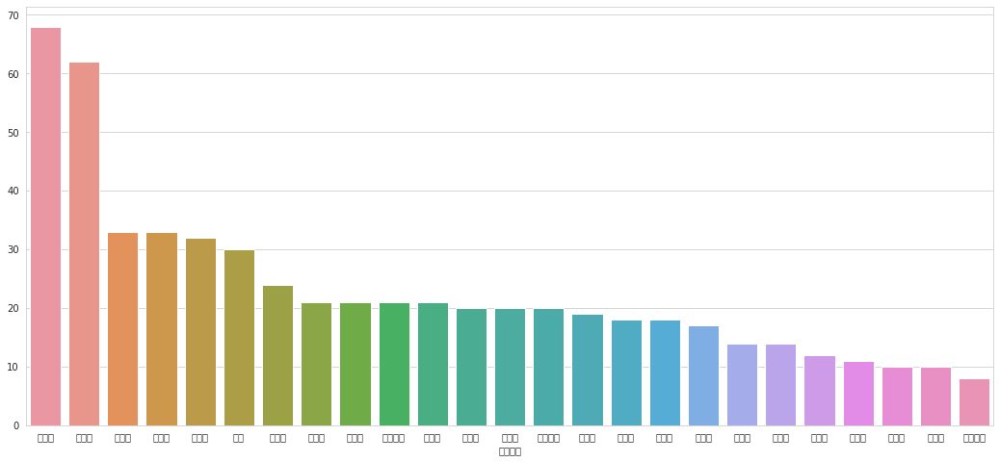

In [89]:
#서점 서울 자치구별 분포 순위 구하기
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#서점 서울 자치구별 분포 순위 구하기
bookstore_count_rank_sorted = filtered_bookstore_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#서점 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(bookstore_count_rank_sorted.index, bookstore_count_rank_sorted.values)
plt.show()

In [90]:
#서점 서울 자치구별 분포 순위 반영하여 표시하기
'''
마포구와 종로구가 top2인 이유
종로 청계천 일대는 과거 출판의 중심지
파주 일산 일대에 8,90년대 전후로 출판시설 집중
동시에 종로 광화문에는 출판과 밀접한 언론사들이 상당수 위치
이에 따라 서울 유통과 파주일산을 연결하는 요충지로 합정 상수 일대가 부상
합정엔 최근 출판사를 거치지않고 작가가 직접 출판하는 책을 판매하는 서점들도 생격나고 있음
'''

#베이스맵 그리기
m42 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#서점 서울 자치구별 분포 순위 반영하여 표시하기
bookstore_count_rank = filtered_bookstore_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m42)

m42.choropleth(geo_data=seoul_geo,
             data=bookstore_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 서점 수'
            )

m42

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


### 전통시장

#### 전통시장 데이터셋

In [91]:
#시장 데이터셋 불러오기
market_df = pd.read_csv('./EDA/market.csv')

#시장 데이터셋 필요한 컬럼 정리
filtered_market_df = market_df[['FCLT_NAME', 'RDNM_ADDR', 'X_CD', 'Y_CD','SGNR_NM', 'STOR_CNT','groupby']]
filtered_market_df.columns = ['시설명','주소', '위도', '경도', '자치구명', '점포수','시장구분']


#### 시장 마커 맵

In [92]:
#베이스맵 그리기
m43 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#시장 위치 마커로 표시하기
from folium import Marker

for _, row in filtered_market_df.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='flag')
          ).add_to(m43)
    
m43

#### 시장 히트맵

In [93]:
'''
인사이트: 시장분포가 가장 높은 중구에 상가 중심으로 많은 시장이 형성됨
두번째 높은 시장분포는 거주인구밀집지역(관악구,영등포구)에 집중됨을 알수 있다.
'''

#베이스맵 그리기
m44 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#시장 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_market_df[['위도', '경도']], 
    radius=25,
).add_to(m44)

m44

#### 자치구별 분포 표시

In [94]:
#베이스맵 그리기
m45 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#시장 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m45)

#시장 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m45)

for lat, long in zip(filtered_market_df['위도'], filtered_market_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='flag')).add_to(marker_cluster)
    
m45

#### 자치구별 분포 순위 

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/

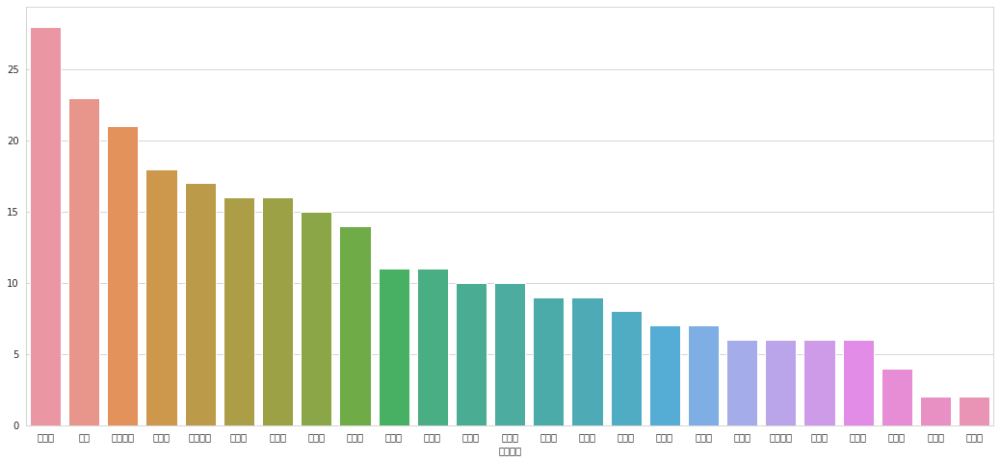

In [95]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#시장 서울 자치구별 분포 순위 구하기
market_count_rank_sorted = filtered_market_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#시장 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(market_count_rank_sorted.index, market_count_rank_sorted.values)
plt.show()

In [96]:
#시장 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m46 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#시장 서울 자치구별 분포 순위 반영하여 표시하기
market_count_rank = filtered_market_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m46)

m46.choropleth(geo_data=seoul_geo,
             data=market_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 전통시장 수'
            )

m46

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


#### 시장종류에 따른 위치 마커

In [97]:
'''
시장은 종류에 따라 분포의 특색이 나타남에 따라 3개 그룹의 특징을 보임
시장은 서울시내 다양하게 위치해있지만, 거주밀집지역 근처에 많은 것을 알수 있고
의류업 중심의 시장은 동대문 중심으로 집중되어 있고, 
상가 시장은 귀금속관련 업종에 오랜역사가 있는 종로구에 밀집됨
'''

filtered_market_df['시장구분'].str.contains('market')

#베이스맵 그리기
m47 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#시장종류에 따라 그룹화
#그룹: 시장, 의류몰, 상가 //market, fashion, store로 구분
from folium import Map, FeatureGroup, Marker, LayerControl, plugins
gs = folium.FeatureGroup(name='Groups', control=False)
m47.add_child(gs)
g1 = folium.plugins.FeatureGroupSubGroup(gs, '시장')
m47.add_child(g1)
g2 = folium.plugins.FeatureGroupSubGroup(gs, '의류몰')
m47.add_child(g2)
g3 = folium.plugins.FeatureGroupSubGroup(gs, '상가')
m47.add_child(g3)

#시장 위치 마커로 표시하기
for _, row in filtered_market_df[filtered_market_df['시장구분'].str.contains('market')].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='beige',icon='flag')
          ).add_to(g1)
for _, row in filtered_market_df[filtered_market_df['시장구분'].str.contains('fashion')].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='flag')
          ).add_to(g2)
for _, row in filtered_market_df[filtered_market_df['시장구분'].str.contains('store')].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='yellow',icon='flag')
          ).add_to(g3)
    
folium.LayerControl(collapsed=False).add_to(m47)

m47

/var/folders/_m/cn5hgvpd2zv9jwrd8sdt55ch0000gn/T/ipykernel_4912/2619533627.py:42: UserWarning: color argument of Icon should be one of: {'gray', 'beige', 'lightgreen', 'darkblue', 'lightred', 'lightgray', 'green', 'cadetblue', 'pink', 'blue', 'darkpurple', 'purple', 'white', 'red', 'darkgreen', 'darkred', 'black', 'orange', 'lightblue'}.
  icon=folium.Icon(color='yellow',icon='flag')


#### 조건에 따른 top5 시설 출력

##### 점포수

In [98]:
#점포수 top5 구하기
market_scale_top5 = filtered_market_df['점포수'].sort_values(ascending=False).head(5).values
market_scale_rank = filtered_market_df[filtered_market_df['점포수'].isin(market_scale_top5)]
market_scale_rank

,시설명,주소,위도,경도,자치구명,점포수,시장구분
0,남대문시장,서울특별시 중구 남대문시장4길 21,37.559186,126.977654,중구,5400,market
1,동대문종합시장,서울특별시 종로구 종로 266 동대문종합시장,37.570707,127.007329,종로구,4300,market
2,평화시장,서울특별시 중구 청계천로 274,37.569426,127.008048,중구,2265,market
3,광장시장,서울특별시 종로구 창경궁로 88,37.570113,126.999707,종로구,1742,market
4,방산종합시장,서울특별시 중구 동호로37길 20(주교동),37.568724,127.000806,중구,1560,market


In [99]:
#조건에 따른 top5 시설 출력: 점포수

#베이스맵 그리기
m48 = folium.Map(location=[37.55, 127.0], tiles='openstreetmap', zoom_start=13)

#시장 위치 마커로 표시하기 - 종로구에 큰 시장이 4개 분포되어 있음
for _, row in market_scale_rank.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red', icon='flag')
          ).add_to(m48)
    
m48

### 공원

#### 공원 데이터셋

In [100]:
#공원 데이터셋 불러오기
park_df = pd.read_csv('./EDA/park.csv')

#공원 데이터셋 필요한 컬럼 정리
filtered_park_df = park_df[['FCLTY_NM', 'LNM_ADDR', 'FCLTY_LA', 'FCLTY_LO','SIGNGU_NM']]
filtered_park_df.columns = ['시설명','주소', '위도', '경도', '자치구명']

#### 공원 마커 맵

In [101]:
#베이스맵 그리기
m49 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공원 위치 마커로 표시하기
from folium import Marker

for _, row in filtered_park_df.iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='green',icon='flag')
          ).add_to(m49)
    
m49

#### 공원 히트맵

In [102]:
'''
서울에 공원이 생각보다 많은 곳에 있고, 
거주밀집지역(관악,송파,강동,양천구)에 집중되어있음
'''

#베이스맵 그리기
m50 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공원 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_park_df[['위도', '경도']], 
    radius=25,
).add_to(m50)

m50

#### 자치구별 분포 표시

In [103]:
#베이스맵 그리기
m51 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공원 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m51)

#공원 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m51)

for lat, long in zip(filtered_park_df['위도'], filtered_park_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='green',icon='flag')).add_to(marker_cluster)
    
m51

#### 자치구별 분포 순위

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3

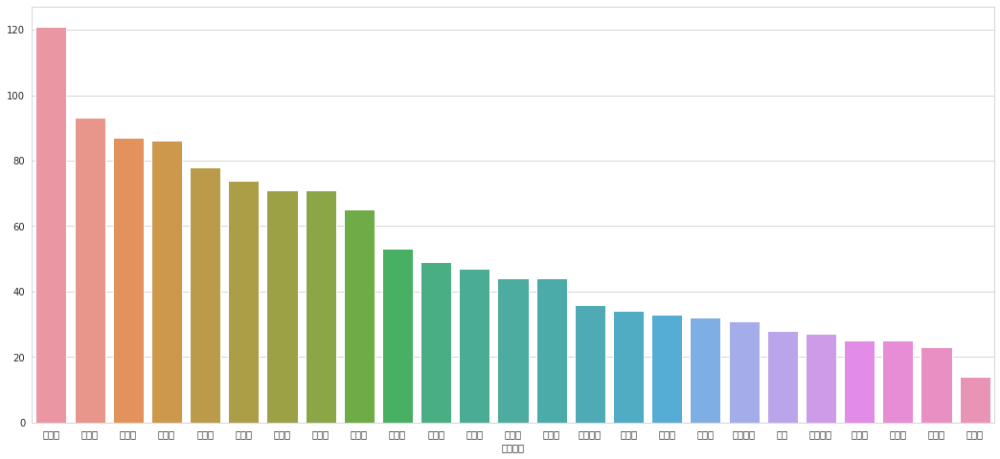

In [104]:
#공원 서울 자치구별 분포 순위 구하기

#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#공원 서울 자치구별 분포 순위 구하기
park_count_rank_sorted = filtered_park_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#공원 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(park_count_rank_sorted.index, park_count_rank_sorted.values)
plt.show()

In [105]:
#공원 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m52 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#공원 서울 자치구별 분포 순위 반영하여 표시하기
park_count_rank = filtered_park_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m52)

m52.choropleth(geo_data=seoul_geo,
             data=park_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 공원 수'
            )

m52

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


### 노인문화시설

#### 노인문화시설 데이터셋

In [106]:
#노인문화시설 데이터셋 불러오기
elderly_df = pd.read_csv('./EDA/elderly.csv')

#노인문화시설 데이터셋 필요한 컬럼 정리
filtered_elderly_df = elderly_df[['fclt_name', 'rdnm_addr', 'x_cd', 'y_cd','sgnr_nm', 'oper_mby']]
filtered_elderly_df.columns = ['시설명','주소', '위도', '경도', '자치구명','시설종류']

#### 시설종류에 따른 위치 마커 맵

In [107]:
#베이스맵 그리기
m57 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#노인문화시설 위치 마커로 표시하기
#시설종류에 따라 그룹화
from folium import Map, FeatureGroup, Marker, LayerControl, plugins

gs = folium.FeatureGroup(name='Groups', control=False)
m57.add_child(gs)
g1 = folium.plugins.FeatureGroupSubGroup(gs, '사회복지법인 노인문화시설')
m57.add_child(g1)
g2 = folium.plugins.FeatureGroupSubGroup(gs, '학교법인 노인문화시설')
m57.add_child(g2)
g3 = folium.plugins.FeatureGroupSubGroup(gs, '재단법인 노인문화시설')
m57.add_child(g3)
g4 = folium.plugins.FeatureGroupSubGroup(gs, '지자체 노인문화시설')
m57.add_child(g4)
g5 = folium.plugins.FeatureGroupSubGroup(gs, '기타 노인문화시설')
m57.add_child(g5)

for _, row in filtered_elderly_df[filtered_elderly_df['시설종류'] == '사회복지법인'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='beige',icon='home')
          ).add_to(g1)
for _, row in filtered_elderly_df[filtered_elderly_df['시설종류'] == '학교법인'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='orange',icon='home')
          ).add_to(g2)
for _, row in filtered_elderly_df[filtered_elderly_df['시설종류'] == '재단법인'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red',icon='home')
          ).add_to(g3)
for _, row in filtered_elderly_df[filtered_elderly_df['시설종류'] == '지자체'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='green',icon='home')
          ).add_to(g4)
for _, row in filtered_elderly_df[~filtered_elderly_df['시설종류'].isin(['사회복지법인','학교법인','재단법인','지자체'])].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='home')
          ).add_to(g5)

folium.LayerControl(collapsed=False).add_to(m57)

m57

#### 노인문화시설 히트맵

In [108]:
#베이스맵 그리기
m58 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#노인문화시설 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_elderly_df[['위도', '경도']], 
    radius=25,
).add_to(m58)

m58

#### 자치구별 분포 표시

In [109]:
#베이스맵 그리기
m59 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#노인문화시설 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m59)

#노인문화시설 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m59)

for lat, long in zip(filtered_elderly_df['위도'], filtered_elderly_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='home')).add_to(marker_cluster)
    
m59

#### 자치구별 분포 순위

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48393 (\N{HANGUL SYLLABLE BONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/

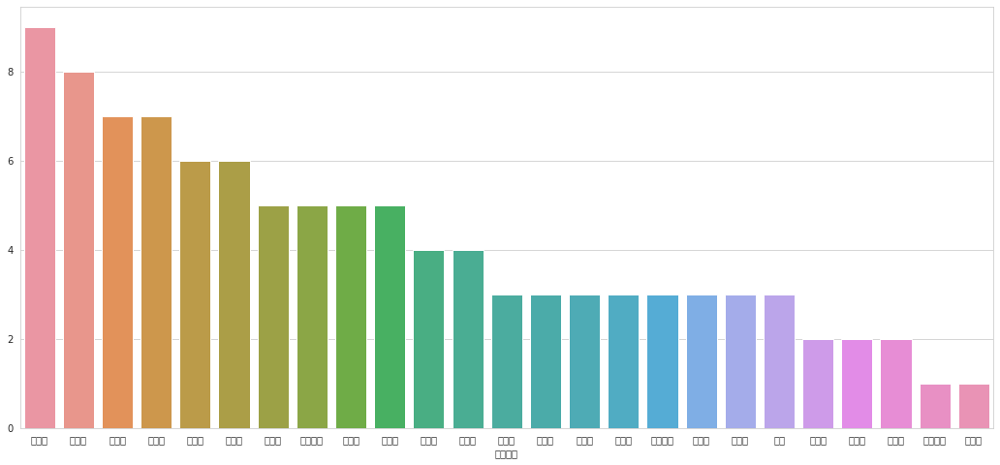

In [110]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#노인문화시설 서울 자치구별 분포 순위 구하기
elderly_count_rank_sorted = filtered_elderly_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#노인문화시설 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(elderly_count_rank_sorted.index, elderly_count_rank_sorted.values)
plt.show()

In [111]:
'''
노인문화시설은 노령인구가 밀집한 지역인 강북에 집중되어 있고
사회법인 노인문화시설이 많은것을 알수 있다.
'''
#노인문화시설 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m60 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#노인문화시설 서울 자치구별 분포 순위 반영하여 표시하기
elderly_count_rank = filtered_elderly_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m60)

m60.choropleth(geo_data=seoul_geo,
             data=elderly_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 노인문화시설 수'
            )

m60

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


### 장애인문화시설

In [112]:
#장애인 실내 문화시설 데이터셋 불러오기
phy_indoor_df = pd.read_csv('./EDA/physically_challenged_indoor.csv')

#장애인 실내 문화시설 데이터셋 필요한 컬럼 정리
filtered_phy_indoor_df = phy_indoor_df[['FCLTY_NM', 'LNM_ADDR', 'FCLTY_LA', 'FCLTY_LO','SIGNGU_NM', 'MLSFC_NM']]
filtered_phy_indoor_df.columns = ['시설명','주소', '위도', '경도', '자치구명','시설종류']

#### 시설종류에 따른 마커 맵

In [113]:
#베이스맵 그리기
m61 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#시설종류에 따라 그룹화
# 그룹 : 문화시설_보호구역, 문화시설_도서관_장애인
from folium import Map, FeatureGroup, Marker, LayerControl, plugins
gs = folium.FeatureGroup(name='Groups', control=False)
m61.add_child(gs)
g1 = folium.plugins.FeatureGroupSubGroup(gs, '복지시설')
m61.add_child(g1)
g2 = folium.plugins.FeatureGroupSubGroup(gs, '점자 도서관')
m61.add_child(g2)


#장애인 실내 문화시설 위치 마커로 표시하기
from folium import Marker
for _, row in filtered_phy_indoor_df[filtered_phy_indoor_df['시설종류'] == '문화시설_보호구역'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='home')
          ).add_to(g1)
for _, row in filtered_phy_indoor_df[filtered_phy_indoor_df['시설종류'] == '문화시설_도서관_장애인'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red',icon='home')
          ).add_to(g2)


folium.LayerControl(collapsed=False).add_to(m61)

m61

#### 장애인 실내 문화시설 히트맵

In [114]:
#베이스맵 그리기
m62 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#장애인 실내 문화시설 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_phy_indoor_df[['위도', '경도']], 
    radius=25,
).add_to(m62)

m62

#### 자치구별 분포 표시

In [115]:

#베이스맵 그리기
m63 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#장애인 실내 문화시설 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m63)

#장애인 실내 문화시설 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m63)

for lat, long in zip(filtered_phy_indoor_df['위도'], filtered_phy_indoor_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='home')).add_to(marker_cluster)
    
m63

#### 자치구별 분포 순위

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3

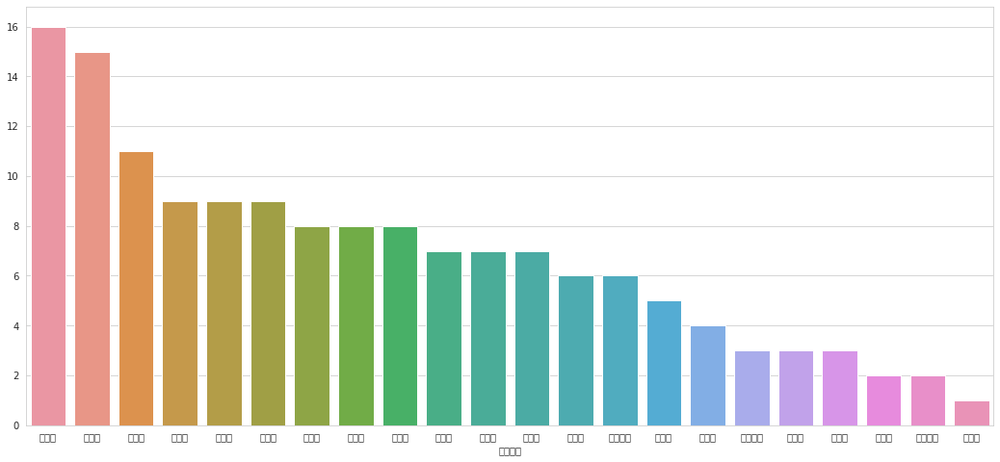

In [116]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#장애인 실내 문화시설 서울 자치구별 분포 순위 구하기
phy_indoor_count_rank_sorted = filtered_phy_indoor_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#장애인 실내 문화시설 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(phy_indoor_count_rank_sorted.index, phy_indoor_count_rank_sorted.values)
plt.show()

In [117]:
'''
장애인 문화시설이 밀집한곳과 열악한 곳이 눈에 띄게 드러나며
밀집한 지역인 강서구와 강남에 집중되어 있고
도봉구가 거주밀집지역인것에 비해 장애인 문화시설의 비중이 낮음
'''

#베이스맵 그리기
m64 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#장애인 실내 문화시설 서울 자치구별 분포 순위 반영하여 표시하기
phy_indoor_count_rank = filtered_phy_indoor_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m64)

m64.choropleth(geo_data=seoul_geo,
             data=phy_indoor_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 장애인 실내 문화시설 수'
            )

m64

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


### 나혼자문화시설

#### 나혼자문화시설 데이터셋

In [118]:
#나혼자문화시설 데이터셋 불러오기
alone_df = pd.read_csv('./EDA/alone.csv')

#나혼자문화시설 데이터셋 필요한 컬럼 정리
filtered_alone_df = alone_df[['FCLTY_NM', 'LNM_ADDR', 'FCLTY_LA', 'FCLTY_LO','SIGNGU_NM', 'MLSFC_NM']]
filtered_alone_df.columns = ['시설명','주소', '위도', '경도', '자치구명','시설종류']

#### 시설 종류에 따른 위치 마커

In [119]:
'''
문화와 예술의 중심인 종로에 나혼자 갈수 있는 문화시설이 집중됨
'''
#베이스맵 그리기
m53 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#나혼자문화시설 위치 마커로 표시하기
#시설종류에 따라 그룹화
from folium import Map, FeatureGroup, Marker, LayerControl, plugins

gs = folium.FeatureGroup(name='Groups', control=False)
m53.add_child(gs)
g1 = folium.plugins.FeatureGroupSubGroup(gs, '나혼자 가기좋은 박물관')
m53.add_child(g1)
g2 = folium.plugins.FeatureGroupSubGroup(gs, '나혼자 가기좋은 극장')
m53.add_child(g2)
g3 = folium.plugins.FeatureGroupSubGroup(gs, '나혼자 가기좋은 문화재단')
m53.add_child(g3)

for _, row in filtered_alone_df[filtered_alone_df['시설종류'] == '문화시설_박물관_나혼자'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='beige',icon='home')
          ).add_to(g1)
for _, row in filtered_alone_df[filtered_alone_df['시설종류'] == '문화시설_극장'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='blue',icon='home')
          ).add_to(g2)
for _, row in filtered_alone_df[filtered_alone_df['시설종류'] == '문화시설_문화재단'].iterrows():
    Marker(location = [row['위도'], row['경도']],
           tooltip=row['시설명'],
           popup= row['주소'],
           icon=folium.Icon(color='red',icon='home')
          ).add_to(g3)

folium.LayerControl(collapsed=False).add_to(m53)

m53

#### 나혼자문화시설 히트맵

In [120]:
#베이스맵 그리기
m54 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#나혼자문화시설 분포 히트맵으로 표시하기
from folium.plugins import HeatMap

HeatMap(
    data=filtered_alone_df[['위도', '경도']], 
    radius=25,
).add_to(m54)

m54

#### 자치구별 분포 표시

In [121]:
#베이스맵 그리기
m55 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#나혼자문화시설 서울 자치구로 나뉜 맵 표시
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m55)

#나혼자문화시설 서울 자치구별 분포 표시하기
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m55)

for lat, long in zip(filtered_alone_df['위도'], filtered_alone_df['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='blue',icon='home')).add_to(marker_cluster)
    
m55

#### 자치구별 분포 순위

['NanumGothic']


/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/heeyoung/opt/anaconda3/

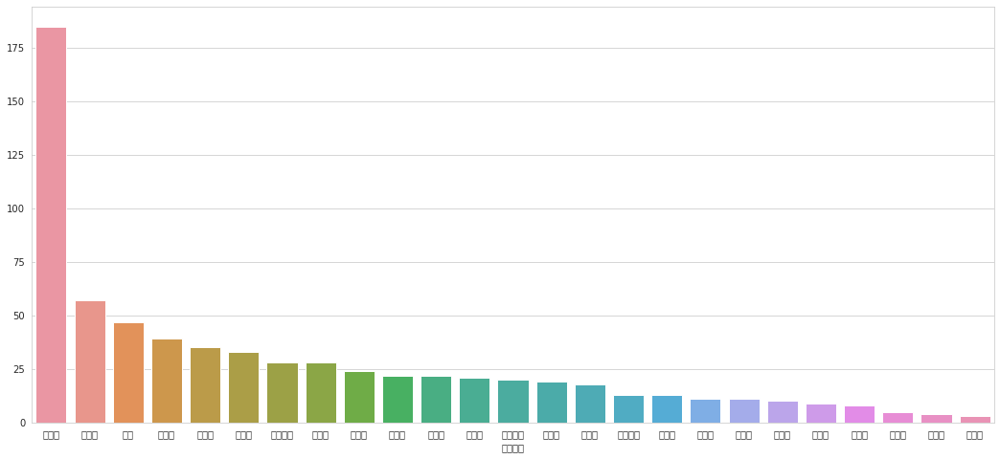

In [122]:
#폰트적용
import matplotlib as mpl
plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])
%matplotlib inline

#나혼자문화시설 서울 자치구별 분포 순위 구하기
alone_count_rank_sorted = filtered_alone_df.groupby('자치구명')['시설명'].count().sort_values(ascending=False)

#나혼자문화시설 서울 자치구별 분포 순위 seaborn으로 표현
plt.figure(figsize=(18, 8))
sns.barplot(alone_count_rank_sorted.index, alone_count_rank_sorted.values)
plt.show()

In [123]:
#나혼자문화시설 서울 자치구별 분포 순위 반영하여 표시하기

#베이스맵 그리기
m56 = folium.Map(location=[37.58, 127.0], tiles='openstreetmap', zoom_start=11)

#나혼자문화시설 서울 자치구별 분포 순위 반영하여 표시하기
alone_count_rank = filtered_alone_df.groupby('자치구명')['시설명'].count()

folium.GeoJson(
    seoul_geo,
    name='지역구'
).add_to(m56)

m56.choropleth(geo_data=seoul_geo,
             data=alone_count_rank,
             fill_color='YlOrRd',
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name='자치구별 나혼자문화시설 수'
            )

m56

/Users/heeyoung/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


## 6. 결론

- 문화 시설별 자치구 분포를 파악 할 수 있었다

### 개선 사항

- 행정동 단위로 세분화하여 발전 가능성
- 퀴커머스 하루배송 서비스가 가장 늦는 지역 등
- 다른 앱과의 연계활용 또는 별도의 검색엔진